In [1]:
using DelimitedFiles
using Plots
using Colors
using Random
using Statistics
using LinearAlgebra
#using LsqFit
using Graphs
using JLD
# using CurveFit
using GLM
using DataFrames
using DataStructures
include("common_functions.jl")
default( framestyle = :box, aspect_ratio=:auto)


In [2]:
NUM_SUBDIVISIONS = 8
ngen = NUM_SUBDIVISIONS
run_no = 1

1

In [3]:
# Read the tiling
const ROT = exp(1im * 2 * pi/5)
file_name = "./data/center_"
gph =  open(readdlm,file_name*string(ngen)*"_graph.txt")
graph = Array{Int}(undef,size(gph)[1], size(gph)[2]) 
for i in 1:size(gph)[1]
    for j in 1:size(gph)[2]
        graph[i,j] = Int(gph[i,j])
    end
end

pts_x = vec(open(readdlm,file_name*string(ngen)*"_pts_re.txt"))
pts_y = vec(open(readdlm,file_name*string(ngen)*"_pts_im.txt"))
pts = [complex(pts_x[i], pts_y[i]) for i in 1:length(pts_x)];

ind_A = round.(Int, vec(open(readdlm,file_name*string(ngen)*"_ind_A.txt")))
ind_B = round.(Int, vec(open(readdlm,file_name*string(ngen)*"_ind_B.txt")))

AtoG = round.(Int, vec(open(readdlm,file_name*string(ngen)*"_AtoG.txt")))
BtoG = round.(Int, vec(open(readdlm,file_name*string(ngen)*"_BtoG.txt")))

max_match = round.(Int, open(readdlm,file_name*string(ngen)*"_max_match.txt"))
plaq = round.(Int, open(readdlm,file_name*string(ngen)*"_plaq.txt"))
plaq_spins = round.(Int, open(readdlm,file_name*string(ngen)*"_plaq_spins.txt"))
# plaq_spins has the format [s1,s2,s3,s4] where 
# s1, s2 share a vertex
# s1, s3 share a vertex
# s4, s2 share a vertex
# s4, s3 share a vertex
# going cyclically, the order or spins is - s1 -- s2 -- s4 -- s3 -

ABedge_no = round.(Int, open(readdlm,file_name*string(ngen)*"_ABedge_no.txt"))
spins_to_edges = round.(Int, open(readdlm,file_name*string(ngen)*"_spins_to_edges.txt"))

monomer_A = vec(round.(Int, open(readdlm,file_name*string(ngen)*"_monomer_A.txt")))
monomer_B = vec(round.(Int, open(readdlm,file_name*string(ngen)*"_monomer_B.txt")))

const nspins = size(spins_to_edges)[1]
const npts = size(graph)[1];
const nplaqs = length(plaq_spins[:,1])
const ymax = maximum(pts_y)

46.9787137637

In [4]:
nbrG = []
for i in 1:npts
    nnn = []
    for j in 1:npts
        if graph[i,j] == 1
            push!(nnn, j)
        end
    end
    push!(nbrG, nnn)
end
nbrG = convert_to_int(nbrG)

Gedge_no = fill(0,npts, npts);
for i in 1:npts
    for j in 1:npts
        if graph[i,j] == 1
            if ind_A[i] < npts+5
                Gedge_no[i,j] = ABedge_no[ind_A[i],ind_B[j]]
            elseif ind_B[i] < npts+5
                Gedge_no[i,j] = ABedge_no[ind_A[j],ind_B[i]]
            else
                println("Error!")
            end
        end
    end
end

spins_pos = generate_spins_pos()
config = reset_config(max_match);

In [5]:
# Generate Graph objects
penrose = Graph(pts, graph, npts, plaq, nplaqs)
spins = Graph(spins_pos, generate_spins_adj(plaq_spins, nspins), nspins, plaq_spins, nplaqs)
dcov = Graph(pts, generate_max_match_adj(max_match, penrose), npts, fill(0,1,1), 0);

In [6]:
# p = plot_generate()
# p = plot_graph(p,penrose)
# p = plot_graph(p, dcov, "black",4, "blue")
# p = plot_membrane(p, get_membrane_edges_theory())
# #p = plot_config(p,config)
# plot_single_point(p, spins_pos[300])
# # display(p)
# ;

# Monte Carlo | Fixed monomers | Full lattice



In [7]:
function sz_correlator(config::Vector{Int64} , running_sum::Vector{Int64}, spin_origin::Int64)
    if config[spin_origin] == 1
        for i in eachindex(running_sum)
            running_sum[i] = running_sum[i] + config[i]
        end
    else
        for i in eachindex(running_sum)
            running_sum[i] = running_sum[i] - config[i]
        end
    end
end

function add_vec!(vec1::Vector{Int64}, vec2::Vector{Int64})
    for i in eachindex(vec1)
        vec1[i] = vec1[i] + vec2[i]
    end
end


add_vec! (generic function with 1 method)

In [8]:
function mc_immobile_no_avg(mc_steps::Int64, Nmix::Int64, config::Vector{Int64} ,  plaq_spins::Matrix{Int64}, spin_origin::Int64 )

    nplaq::Int64 = size(plaq_spins)[1]
    nspins::Int64 = length(config)
    szsz::Vector{Int64} = fill(0,nspins)
    sz_avg::Vector{Int64} = fill(0,nspins)

    s1::Int64 = 0
    s2::Int64 = 0
    s3::Int64 = 0
    s4::Int64 = 0

    random_plaq::Int64 = 0

    for i in 1:mc_steps
        for j in 1:Nmix
            while true
                random_plaq = rand(1:nplaq)
                s1 = plaq_spins[random_plaq,1]
                s2 = plaq_spins[random_plaq,2]
                s3 = plaq_spins[random_plaq,3]
                s4 = plaq_spins[random_plaq,4]

                if config[s1] == 1 && config[s4] == 1
                    config[s1] = -1
                    config[s4] = -1
                    config[s2] = 1
                    config[s3] = 1
                    break
                elseif config[s3] == 1 && config[s2] == 1
                    config[s1] = 1
                    config[s4] = 1
                    config[s2] = -1
                    config[s3] = -1
                    break
                end
            end
        end
        sz_avg .= sz_avg .+ config
        #add_vec!(sz_avg, config)
        sz_correlator(config, szsz, spin_origin)

    end

    sz_corr_array_float= szsz/mc_steps
    sz_avg_float = sz_avg/mc_steps

    return sz_avg_float, sz_corr_array_float
end
;

In [9]:
mc_steps = 5*1000*100
Nmix = 100
spin_origin = 300 # 4500 # 651
config = reset_config(max_match)
@time sz, szsz = mc_immobile_no_avg(mc_steps, Nmix, config ,  plaq_spins, spin_origin);

  8.002045 seconds (12 allocations: 512.250 KiB)


# Monte Carlo | Mobile monomers | Full lattice

In [10]:

function monomer_move(config::Vector{Int64}, npts::Int64, Gedge_no::Matrix{Int64}, nbrG::Vector{Vector{Int64}})
    initial_site::Int64 = rand(1:npts)
    nbr_initial::Vector{Int64} = nbrG[initial_site]

    for i in nbr_initial
        if config[Gedge_no[initial_site, i]] == 1
            # there is a dimer
            return false
        end
    end

    # at this point, we know initial_site is a monomer
    special_nbr::Int64 = rand(nbr_initial)
    nnbr::Vector{Int64} = nbrG[special_nbr]
    for i in nnbr
        if config[Gedge_no[i,special_nbr]] == 1
            config[Gedge_no[i,special_nbr]] = -1
            config[Gedge_no[initial_site, special_nbr]] = 1
            return true
        end
    end
    return false
end

function plaq_move(config::Vector{Int64}, nplaqs::Int64, plaq_spins::Matrix{Int64})
    random_plaq = rand(1:nplaqs)
    s1 = plaq_spins[random_plaq,1]
    s2 = plaq_spins[random_plaq,2]
    s3 = plaq_spins[random_plaq,3]
    s4 = plaq_spins[random_plaq,4]

    if config[s1] == 1 && config[s4] == 1
        config[s1] = -1
        config[s4] = -1
        config[s2] = 1
        config[s3] = 1
        return true
    elseif config[s3] == 1 && config[s2] == 1
        config[s1] = 1
        config[s4] = 1
        config[s2] = -1
        config[s3] = -1
        return true
    end
    return false
end
    

plaq_move (generic function with 1 method)

In [11]:
function mc_mobile_full_no_avg(mc_steps::Int64, Nmix::Int64, config::Vector{Int64} ,  plaq_spins::Matrix{Int64}, spin_origin::Int64, Gedge_no::Matrix{Int64} , nbrG::Vector{Vector{Int64}})
    
    nplaqs::Int64 = size(plaq_spins)[1]
    nspins::Int64 = length(config)
    sz_corr_array::Vector{Int64} = fill(0,nspins)
    sz_avg::Vector{Int64} = fill(0,nspins)
    actual_steps = 0


    for i in 1:mc_steps
        for j in 1:Nmix
            while !monomer_move(config, npts, Gedge_no, nbrG)
            end
            while !plaq_move(config, nplaqs, plaq_spins)
            end
        end
        add_vec!(sz_avg, config)
        sz_correlator(config, sz_corr_array, spin_origin)
    end

    sz_corr_array_float= sz_corr_array/mc_steps
    sz_avg_float = sz_avg/mc_steps

    return sz_avg_float, sz_corr_array_float
end
;

In [12]:
mc_steps = 2*10*1000
Nmix = 100
spin_origin = 300
config = reset_config(max_match)
@time sz_disg, szsz_disg = mc_mobile_full_no_avg(mc_steps, Nmix, config ,  plaq_spins, spin_origin, Gedge_no, convert_to_int(nbrG));

  1.432621 seconds (16.43 k allocations: 1.645 MiB, 0.27% compilation time)


# Generate disconnected graph

In [13]:
function get_monomer_membranes_numerics(sz)
    membrane_edges = []
    for i in 1:nspins
        if abs(sz[i] +1.0)<1e-3
            a, b = spins_to_edges[i,:]
            push!(membrane_edges, [AtoG[a], BtoG[b]])
        end
    end
    return convert_to_int(membrane_edges)
end

monomer_membrane = get_monomer_membranes_numerics(sz);

function generate_disconnected_graph(sz)
    disg =  Graph(copy(pts), copy(graph), copy(npts), copy(plaq), copy(nplaqs))
    monomer_membrane = get_monomer_membranes_numerics(sz)
    for i in monomer_membrane
        p1, p2 = i
        disg.adj[p1,p2] = 0
        disg.adj[p2,p1] = 0
    end
    return disg
end

generate_disconnected_graph (generic function with 1 method)

In [14]:
disg = generate_disconnected_graph(sz_disg)

g = SimpleGraph(disg.adj)
ccg = connected_components(g)
;

In [15]:
membrane = get_monomer_membranes_numerics(sz_disg);

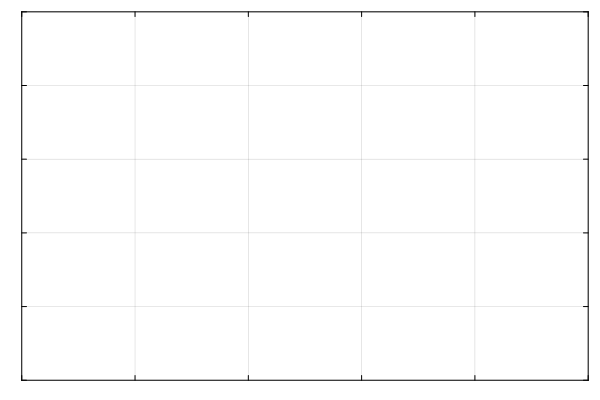

In [16]:
p = plot(framestyle=:box,formatter=(_...) -> "")

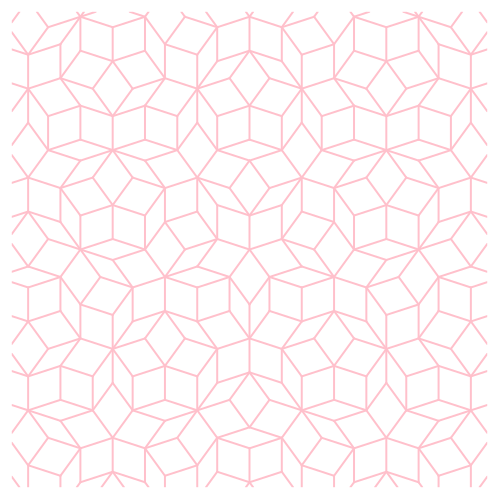

In [17]:
# p = plot_generate(1000)
# size = 1000;
legend = false;
ylim = (-ymax-0.1,ymax+0.1);
p = plot(size = (500,500), aspect_ratio = :equal , legend = legend, ylim = (-7,7), xlim=(-7,7), axis=([], false), formatter=(_...) -> "", framestyle = :box)

p = plot_edges(p, penrose)
# p = plot_sites(p, spins, :blue, 0; annotate = false, markersize=  2)
# p = plot_membrane(p, membrane )
# for l in membrane
#     i, j = l
#     plot!(p, [pts_x[i], pts_x[j]],[pts_y[i] , pts_y[j]], linecolor="brown", linewidth=7, label="")
# end

fs = 35
# p = annotate!(7, 2, text("\$ \\mathcal{R}_1 \$",  fs))
# p = annotate!(10,-4, text("\$ \\mathcal{R}_2 \$",  fs))
# p = annotate!(28,0, text("\$ \\mathcal{R}_3 \$",  fs))
# p = plot_config(p,reset_config(max_match) )
# p = plot!([(7,2)];texts=["\$ \\mathcal{R}_1 \$"])
# p = plot!([ (10,-4)];texts=["\$ \\mathcal{R}_2 \$"])
# p = plot!([(28,0)];texts=["\$ \\mathcal{R}_3 \$"])
display(p)
# savefig(p,"./paper_images/maximal_covering.pdf")
# savefig(p,"./paper_images/maximal_covering.svg")

;

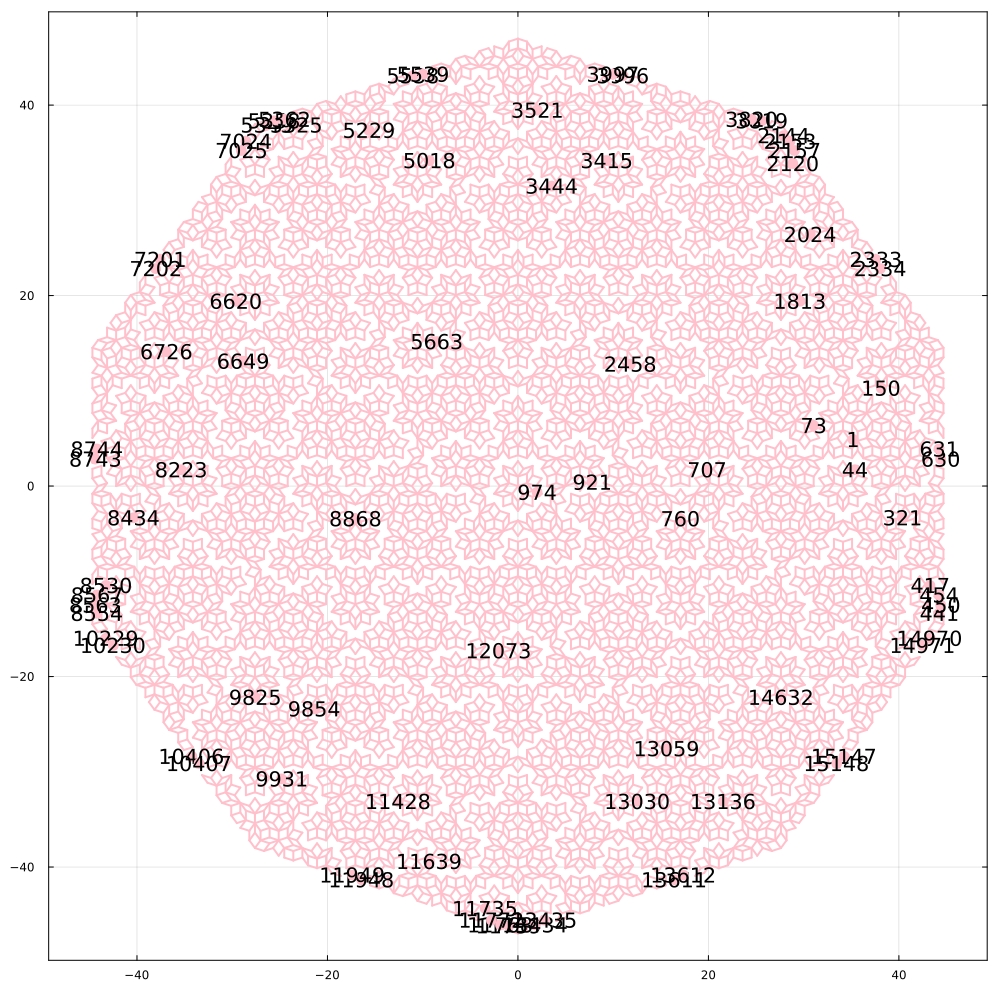

In [18]:
disg = generate_disconnected_graph(sz_disg)

p = plot_generate(1000)
p = plot_edges(p, disg)
# p = plot_sites(p, spins, :blue, 0; annotate = false, markersize=  2)
for i in 1:length(ccg)
    j = -1
    for k in 1:disg.n
        if disg.adj[ccg[i][1],k] == 1
            j = k
            break
        end
    end
    spin_number = Gedge_no[ccg[i][1],j]
    # spin_number = Gedge_no[ccg[i][1], nbrG[ccg[i][1]][1]]
    point = spins_pos[spin_number]
    scatter!(p, [real(point)], [imag(point)], mc=:pink, markerstrokewidth=0, series_annotations = string(spin_number), label = "",  markersize=6)
end
display(p)
;

# SETTING SPIN ORIGIN HERE

In [20]:
# SETTING SPIN ORIGIN HERE -------------------------------------------------
# ##################################################################################################################################################
# Different regions for ngen=8: 921, 707, 1
# Different regions for ngen=7: 390, 292, 1
# spin_origin = 707
spin_origin = 707

# For R2 (paper R1), spin_origin = 1
# For R3 (paper R2), spin_origin = 707
# ##################################################################################################################################################

707

In [21]:
# p = plot_generate(500)
# plot_edges(p,penrose)
# # plot_sites(p,spins, "orange",0, annotate=false)
# #config = reset_config(max_match)
# #plot_config(p,config)
# plot_single_point(p,spins_pos[spin_origin])
# # plot_membrane(p,get_monomer_membranes_numerics(sz))
# ;


# Generate subgraph

In [22]:
sub_lat = 0
a, b = spins_to_edges[spin_origin,:]
p1 = AtoG[a]
p2 = BtoG[b]
for i in 1:length(ccg)
    if p1 in ccg[i] && p2 in ccg[i]
        sub_lat = ccg[i]
        break
    end
end
println(length(sub_lat))
println(sub_lat)

sub_npts = length(sub_lat)
sub_pts = [pts[sub_lat[i]] for i in 1:length(sub_lat)]

lat_to_sublat = fill(0, npts)
for i in 1:sub_npts
    lat_to_sublat[sub_lat[i]] = i
end

sub_spins = Array{Int64}(undef, 0)
sub_graph = fill(0, (sub_npts, sub_npts)) 

sub_spins_to_full_spins = fill(0, nspins)
sub_spins_lat_mat = fill(0,sub_npts, sub_npts)

for i in 1:sub_npts-1
    for j in i+1:sub_npts
        if graph[sub_lat[i], sub_lat[j]] == 1
            sub_graph[i,j] = 1
            sub_graph[j,i] = 1
            push!(sub_spins, Gedge_no[sub_lat[i], sub_lat[j]])
            sub_spins_to_full_spins[Gedge_no[sub_lat[i], sub_lat[j]]] = length(sub_spins)
            sub_spins_lat_mat[i,j] = length(sub_spins)
            sub_spins_lat_mat[j,i] = length(sub_spins)
        end
    end
end

sub_spins_to_edges = fill(0,2, length(sub_spins))
count = 1
for i in 1:sub_npts-1
    for j in i+1:sub_npts
        if graph[sub_lat[i], sub_lat[j]] == 1
            sub_spins_to_edges[1, count] = i
            sub_spins_to_edges[2, count] = j
            count += 1
        end
    end
end

sub_spins_pos = fill(0.0+0.0im, length(sub_spins))
for i in 1:length(sub_spins)
    sub_spins_pos[i] = spins_pos[sub_spins[i]]
end

sub_plaq = [] # These are spin plaquettes
for i in 1:size(plaq_spins)[1]
    s1, s2, s3, s4 = plaq_spins[i,:]
    if s1 in sub_spins && s2 in sub_spins && s3 in sub_spins && s4 in sub_spins
        push!(sub_plaq, [sub_spins_to_full_spins[s1], sub_spins_to_full_spins[s2], sub_spins_to_full_spins[s3], sub_spins_to_full_spins[s4]])
    end
end
sub_plaq_temp = fill(0,length(sub_plaq),4)
for i in 1:length(sub_plaq)
    for j in 1:4
        sub_plaq_temp[i,j] = sub_plaq[i][j]
    end
end
sub_plaq = sub_plaq_temp
sub_nspins = length(sub_spins)
sub_nbr = []
for i in 1:sub_npts
    temp = []
    for j in 1:sub_npts
        if sub_graph[i, j] == 1
            push!(temp, j)
        end
    end
    push!(sub_nbr, temp)
end

sub_nplaq = size(sub_plaq)[1]
sub_spins_graph2 = fill(0,sub_nspins, sub_nspins);
for i in 1:sub_nplaq
    s1, s2, s3, s4 = sub_plaq[i,:]
    sub_spins_graph2[s1, s3] = 1
    sub_spins_graph2[s1, s2] = 1
    sub_spins_graph2[s3, s4] = 1
    sub_spins_graph2[s4, s2] = 1
    
    sub_spins_graph2[s3, s1] = 1
    sub_spins_graph2[s2, s1] = 1
    sub_spins_graph2[s4, s3] = 1
    sub_spins_graph2[s2, s4] = 1
end

sub_spins_graph = fill(0, sub_nspins, sub_nspins)
for i in 1:nspins
    if sub_spins_to_full_spins[i] > 0
        for j in 1:nspins
            if spins.adj[i,j] == 1 && sub_spins_to_full_spins[j] > 0
                sub_spins_graph[sub_spins_to_full_spins[i] , sub_spins_to_full_spins[j]] = 1
                sub_spins_graph[sub_spins_to_full_spins[j] , sub_spins_to_full_spins[i]] = 1
            end
        end
    end
end

sub_penrose = Graph(sub_pts, sub_graph, sub_npts, fill(0,1,1), length(sub_plaq[:,1]))
sub_penrose_spin = Graph(sub_spins_pos, sub_spins_graph,length(sub_spins_pos), sub_plaq , length(sub_plaq[:,1]))

sub_lat_nbr_spin = []
sub_penrose_nbr = get_sub_neighbors(sub_penrose)
for i in 1:sub_penrose.n
    temp = []
    for neighbor in sub_penrose_nbr[i]
        append!(temp, sub_spins_lat_mat[i,neighbor])
    end
    push!(sub_lat_nbr_spin, temp)
end
sub_lat_nbr_spin = convert_to_int(sub_lat_nbr_spin)
;

1300
[340, 341, 344, 345, 346, 347, 357, 360, 361, 367, 368, 370, 371, 372, 373, 374, 375, 376, 377, 396, 397, 400, 401, 402, 424, 428, 431, 432, 437, 438, 439, 440, 441, 442, 443, 444, 445, 455, 458, 468, 469, 472, 473, 474, 475, 484, 487, 488, 493, 494, 496, 497, 498, 499, 500, 501, 502, 503, 504, 505, 506, 507, 508, 509, 510, 511, 512, 514, 515, 516, 517, 518, 519, 520, 521, 522, 523, 524, 527, 531, 532, 533, 534, 535, 536, 538, 540, 541, 545, 548, 549, 550, 551, 552, 553, 554, 630, 631, 634, 635, 636, 637, 647, 650, 651, 656, 657, 659, 660, 661, 662, 663, 664, 665, 666, 685, 686, 689, 690, 691, 713, 798, 799, 801, 802, 803, 810, 813, 814, 815, 816, 817, 818, 819, 829, 832, 833, 849, 1176, 1177, 1180, 1181, 1182, 1183, 1192, 1195, 1196, 1202, 1203, 1205, 1206, 1207, 1208, 1209, 1210, 1211, 1212, 1225, 1226, 1229, 1230, 1231, 1250, 1254, 1257, 1258, 1262, 1263, 1264, 1265, 1266, 1267, 1268, 1269, 1270, 1275, 1278, 1287, 1288, 1290, 1291, 1292, 1293, 1300, 1302, 1303, 1307, 1308, 1309

In [23]:
size(sub_plaq)[1]

965

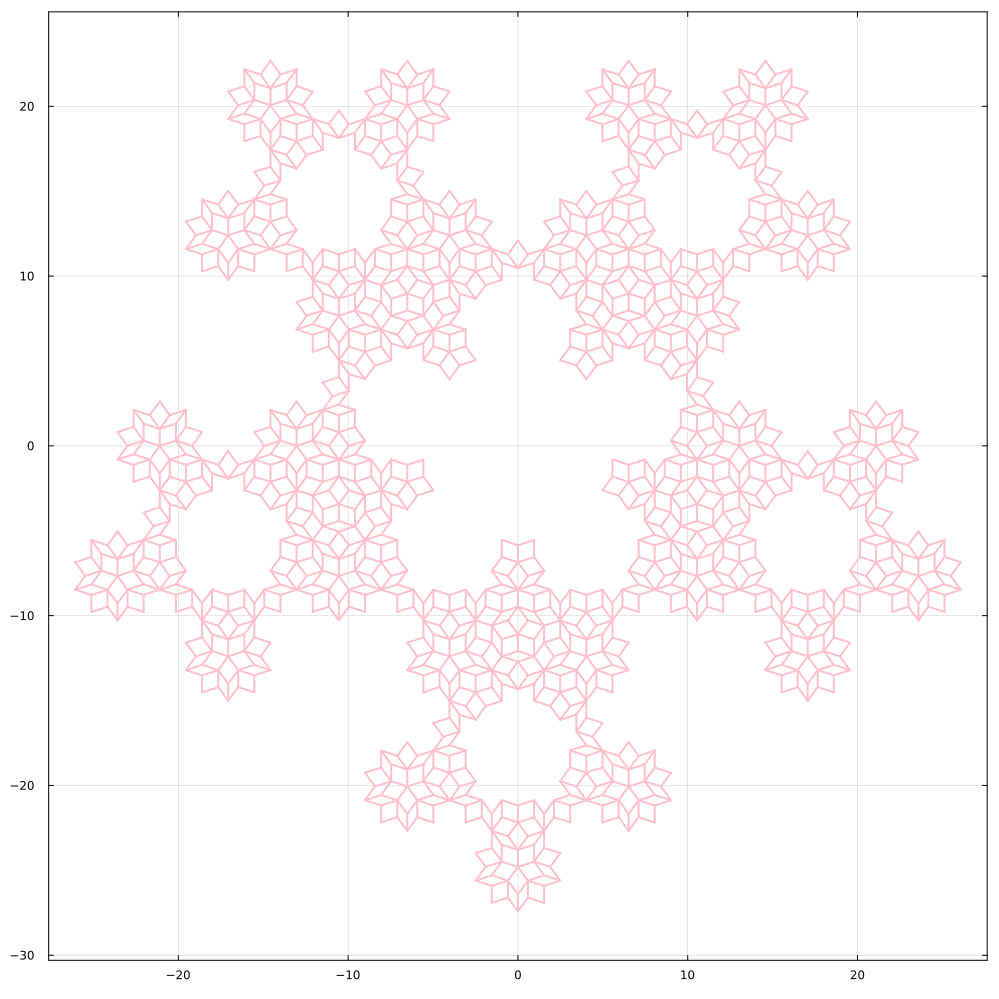

In [24]:
p = plot_generate(1000)
plot_edges(p,sub_penrose)
# plot_sites(p,sub_penrose, "orange",0, annotate=false)



# Sz-Sz | Mobile 

In [25]:
function sz_correlator_mat(config::Vector{Int64}, running_sum::Matrix{Int64}, nspins::Int64)
    for origin in 1:nspins-1
        if config[origin] == 1
            for pt2 in origin+1:nspins
                running_sum[pt2,origin] = running_sum[pt2,origin] + config[pt2]
            end
        else
            for pt2 in origin+1:nspins
                running_sum[pt2,origin] = running_sum[pt2,origin] - config[pt2]
            end 
        end
    end
end


sz_correlator_mat (generic function with 1 method)

# Generate vison paths

In [26]:
spin_to_plaq = []
 
for i in 1:sub_penrose_spin.n
    temp = []
    for j in 1:size(sub_penrose_spin.plaq)[1]
        flag =  false
        if i in sub_penrose_spin.plaq[j,:]
            push!(temp, j[1])
        end
    end
    push!(spin_to_plaq, temp)
end

spin_to_plaq = convert_to_int(spin_to_plaq);
cplaq = length.(spin_to_plaq);

sub_spins_graph_nbr = []
for i in 1:sub_nspins
    temp = []
    for j in 1:sub_nspins
        if sub_spins_graph[i,j] == 1
            push!(temp, j)
        end
    end
    push!(sub_spins_graph_nbr, temp)
end

vison_spins_graph_nbr = []
for i in 1:sub_nspins
    temp = []
    pq = spin_to_plaq[i]
    for pl in pq
        temp = vcat(temp, sub_plaq[pl,:])
    end
    temp = unique(temp)
    filter!(e->e≠i,temp)
    push!(vison_spins_graph_nbr, temp)
end
for i in 1:length(sub_spins_graph_nbr)
    for xx in sub_spins_graph_nbr[i]
        if !( xx ∈ vison_spins_graph_nbr[i])
            push!(vison_spins_graph_nbr[i], xx)
        end
    end
end
vison_spins_graph_nbr = convert_to_int(convert_to_int(vison_spins_graph_nbr))
;

In [27]:
sub_penrose_spin.n

2270

In [28]:
spins_to_plaqs

UndefVarError: UndefVarError: `spins_to_plaqs` not defined in `Main`
Suggestion: check for spelling errors or missing imports.

In [29]:
spin_cno = sum(sub_penrose_spin.adj, dims=1)
# spin_nbr = get_sub_neighbors(sub_penrose_spin)
function get_good_path(src::Int64, len::Int64, spin_cno::Matrix{Int64},vison_spins_graph_nbr:: Vector{Vector{Int64}}, spins_to_plaqs::Vector{Vector{Int64}}, sub_nplaq::Int64, Ntries::Int64 = 10)
    path = [src]
    plaq_visited = fill(0, sub_nplaq)
    for i in spins_to_plaqs[src]
        plaq_visited[i] += 1
    end
    for i in 1:Ntries
        if len<0
            return path
        end
        next_pt = 0
        for j in shuffle(vison_spins_graph_nbr[path[end]])
            # println("j = ",j)
            if j ∈ path
                # backtracking
                continue
            end
            plaqs = spins_to_plaqs[j]
            if length(plaqs) == 1 && plaq_visited[plaqs[1]] <= 1
                push!(path, j)
                len -= 1
                plaq_visited[plaqs[1]] += 1
                break
            elseif length(plaqs) == 2 && (plaq_visited[plaqs[1]] == 0 && plaq_visited[plaqs[2]] == 1) || (plaq_visited[plaqs[1]] == 1 && plaq_visited[plaqs[2]] == 0)
                push!(path, j)
                len -= 1
                plaq_visited[plaqs[1]] += 1
                plaq_visited[plaqs[2]] += 1
                break
            end
        end
    end
    return path
end

function get_good_path_maxl(src::Int64, len::Int64, spins_to_plaqs::Vector{Vector{Int64}}, sub_nplaq::Int64,vison_spins_graph_nbr:: Vector{Vector{Int64}}, Ntries, Nsamp = 1000)
    spin_cno = sum(sub_penrose_spin.adj, dims=1)
    # spin_nbr = convert_to_int(get_sub_neighbors(sub_penrose_spin))
    list_paths = []
    for i in 1:Nsamp
        new_path = get_good_path(src, len, spin_cno, vison_spins_graph_nbr,spins_to_plaqs, sub_nplaq, Ntries)
        push!(list_paths,new_path )
        if length(new_path) == len
            break
        end
    end
    mxval, mxindex = findmax(length.(list_paths))
    return list_paths[mxindex]
end

get_good_path_maxl (generic function with 2 methods)

In [30]:
function generate_symm_path(path::Vector{Int64}, pts::Vector{ComplexF64})
    symm_path = []
    for i in 0:4
        curr_path::Vector{Int64} = []
        curr_path_r::Vector{Int64} = []
        for j in path
            symm_pt = ROT^i * pts[j]
            symm_pt_r = reflectY( ROT^i * pts[j] )
            push!(curr_path, pos_to_spin_index(symm_pt, pts))
            push!(curr_path_r, pos_to_spin_index(symm_pt_r, pts))
        end
        push!(symm_path, curr_path)
        push!(symm_path, curr_path_r)
    end
    return transp( convert_to_matrix_int(symm_path))
end
    

generate_symm_path (generic function with 1 method)

In [31]:
spins_to_plaqs = [[] for i in 1:sub_nspins]
for i in 1:sub_nplaq    
    for j in sub_penrose_spin.plaq[i,:]
        push!(spins_to_plaqs[j], i)
    end
end

In [32]:
spins_to_plaqs = [[] for i in 1:sub_nspins]
for i in 1:sub_nplaq    
    for j in sub_penrose_spin.plaq[i,:]
        push!(spins_to_plaqs[j], i)
    end
end
spins_to_plaqs = convert_to_int(spins_to_plaqs)

npaths = 500
lpath =  40
paths = Vector{Int64}[]
for i in 1:npaths
    pp = []
    while true
        pp = get_good_path_maxl(rand(1:sub_penrose_spin.n), lpath,spins_to_plaqs, sub_nplaq,vison_spins_graph_nbr,3*lpath, 1000)# 100,500)
        if length(pp) > 2
            break
        end
    end
    push!(paths, pp)
end
# paths = paths
# paths = convert_to_int(convert_to_int(paths))

l_paths = [length(paths[i]) for i in 1:length(paths)]
println(l_paths)
mega_path::Vector{Matrix{Int64}} = [generate_symm_path(pth, sub_penrose_spin.pts) for pth in paths]
;

[42, 42, 40, 41, 42, 42, 40, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 40, 42, 42, 42, 40, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 40, 40, 42, 40, 42, 42, 42, 42, 42, 42, 40, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 40, 40, 42, 42, 42, 42, 42, 42, 42, 40, 40, 40, 42, 42, 40, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 40, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 40, 40, 42, 42, 42, 42, 42, 42, 42, 42, 40, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 40, 42, 42, 40, 42, 42, 40, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 40, 42, 40, 42, 42, 42, 40, 42, 40, 42, 42, 42, 40, 42, 42, 42, 42, 42, 42, 42, 40, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 42, 40, 42, 40,

In [33]:
size.(mega_path)

500-element Vector{Tuple{Int64, Int64}}:
 (42, 10)
 (42, 10)
 (40, 10)
 (41, 10)
 (42, 10)
 (42, 10)
 (40, 10)
 (42, 10)
 (42, 10)
 (42, 10)
 ⋮
 (42, 10)
 (42, 10)
 (42, 10)
 (42, 10)
 (42, 10)
 (42, 10)
 (42, 10)
 (42, 10)
 (42, 10)

In [34]:
# #plot paths
# for j in 1:5
#     # p = plot_generate(1000)
#     siz = 6000
#     p = plot(size = (siz,siz) , aspect_ratio = :equal, legend = false, ylim = (-50,50), xlim = (-50,50))
#     plot_edges(p,sub_penrose)
#     # plot_edges(p,sub_penrose_spin, "purple", 2)
#     plot_sites(p,sub_penrose_spin,:blue,6; annotate=false, markersize=0 )
#     # i = rand(1:npaths)
#     # sub_plot_path(p,mega_path[i][:,2])
#     # sub_plot_path(p,custom_path)
#     sub_plot_path(p,mega_path[j][:,3])
#     # sub_plot_path(p,mega_path[1][:,5])
#     savefig(p,"./images/del/foo_vison"*string(j)*".png")
#     # display(p)
# end

# Vison | Mobile

In [35]:
function vis(sub_config::Vector{Int64}, running_sum::Vector{Matrix{Int64}}, npaths::Int64,lpath::Vector{Int64},  paths::Vector{Vector{Int64}})
    for i in 1:npaths
        for j in 1:lpath[i]-1
            prod = sub_config[paths[i][j]]
            for k in j+1:lpath[i]
                prod = prod * sub_config[paths[i][k]]
                running_sum[i][k,j] = running_sum[i][k,j] + prod
            end
        end
    end
end
function vis_partial(config::Vector{Int64}, running_sum::Vector{Matrix{Int64}}, npaths::Int64,lpath::Vector{Int64},  mega_path::Vector{Matrix{Int64}})
    for i in 1:npaths
        for j in 1:10
            prod = config[mega_path[i][1,j]]
            for k in 2:lpath[i]
                prod = prod * config[mega_path[i][k,j]]
                running_sum[i][k,j] = running_sum[i][k,j] + prod
            end
        end
    end
end
function symmetrise_vison(vison::Vector{Matrix{Float64}}, lpath::Vector{Int64}, npaths::Int64)
    for i in 1:npaths
        for j in 1:lpath[i]-1
            for k in j+1:lpath[i]
                vison[i][j,k] = vison[i][k,j]
            end
            vison[i][j,j] = 1
        end
        vison[i][lpath[i], lpath[i]] = 1
    end
end

symmetrise_vison (generic function with 1 method)

In [36]:
function post_process_vison_lite(vison, paths)
    distance = []
    vis_vector = []
    for i in 1:length(paths)
        current_path = paths[i]
        for j in 1:length(current_path)-1
            for k in j+1:length(current_path)
                push!(distance, abs(sub_spins_pos[current_path[j]] - sub_spins_pos[current_path[k]]))
                push!(vis_vector, abs(vison[i][j,k]))
            end
        end
    end
    return distance, vis_vector
end

function post_process_vison(vison, paths;  averaging_radius = 0.4)    
    distance = []
    vis_vector = []
    for i in 1:length(paths)
        current_path = paths[i]
        for j in 1:length(current_path)-1
            for k in j+1:length(current_path)
                push!(distance, abs(sub_spins_pos[current_path[j]] - sub_spins_pos[current_path[k]]))
                push!(vis_vector, abs(vison[i][j,k]))
            end
        end
    end
    #display(scatter(distance, (vis_vector)))

    clean_dist = []
    clean_vis = []
    visited = fill(0,length(distance))
    for i in 1:length(distance)
        if visited[i] == 1 
            continue
        end
        push!(clean_dist, distance[i])
        temp = []
        for j in 1:length(distance)
            if abs(distance[i] - distance[j]) < averaging_radius && visited[j] == 0
                push!(temp, vis_vector[j])
                visited[j] = 1
            end
        end
        # visited[i] = 1
        push!(clean_vis,  mean(temp))
        if i== 1
            println(length(temp))
        end
    end
    # display( scatter( clean_dist, clean_vis ) )
    display( scatter( (clean_dist), log.(clean_vis) ) )
    return clean_dist, clean_vis
end

post_process_vison (generic function with 1 method)

# Monomer FM | Mobile

In [38]:
# p = plot_generate(1000)
# p = plot_edges(p,sub_penrose, "pink",2)

# p = plot_sites(p, sub_penrose,:red,0;annotate=true)
# display(p)


In [40]:
cno = sum(sub_penrose.adj;dims=1)[1,:];
function generate_monomer_path(l::Int64,sub_nbrG::Vector{Vector{Int64}}, Ntries::Int64=100)
    npts = sub_penrose.n
    counter = l
    start = rand(1:npts)
    path = [start, rand(sub_nbrG[start])]
    done = false
    for i in 1:Ntries
        current_pt = path[end]
        previous_pt = path[end-1]
        rnbr = shuffle(sub_nbrG[current_pt])
        closing = false
        for next_pt in rnbr
            if next_pt != previous_pt
                if next_pt in path
                    push!(path, next_pt)
                    # println("Found loop")
                    temp = [pop!(path)]
                    while length(path) > 0
                        new_pt = pop!(path)
                        if new_pt == next_pt
                            # if (cno[temp[1]] == 3 || cno[temp[1]] == 5 ) && (cno[temp[end]] == 3 || cno[temp[end]] == 5)
                            #     return temp
                            # else
                            #     return []
                            # end 
                            return temp
                        else
                            push!(temp, new_pt)
                        end
                    end
                    return path
                else
                    push!(path, next_pt)
                    break
                end
            end
        end
        if length(path) >= l
            return []
        end
        
    end
    return  []
end

function split_loop(loop)
    len = length(loop)
    # if isodd(len)
    #     println("Not a closed loop")
    #     return []
    # end
    return [loop[1:len ÷ 2], loop[len÷2 + 1 : end] ]
end
function boundary_path_check(path, spin_graph)
    for sp in path
        count = 0
        for j in 1:spin_graph.nplaq
            if sp in sub_penrose_spin.plaq[j,:]
                count = count + 1
            end
        end
        if count == 1
            return true
        end
    end
    return false
end
lat_path_to_spin_path(ppp) = [sub_spins_lat_mat[ppp[i],ppp[i%length(ppp) + 1]] for i in 1:length(ppp)]
function generate_mbasis(sub_penrose::Graph)
    lval = [4, 6, 8, 10, 12, 14, 16, 18, 20]
    basis = [[] for i in 1:length(lval)]
    
    np = 2000
    counter = 0
    nbrG_sub_penrose = get_nbrG(sub_penrose)
    while counter < 400 * 10
        curr = generate_monomer_path(100,nbrG_sub_penrose, 200)
        if minimum(lval) <= length(curr) <= maximum(lval)
            ind = (length(curr) - lval[1]) ÷ 2 +1
            # ind = length(curr) ÷ lval[1] # -2
            if length(basis[ind]) < np
                push!(basis[ind], curr)
            end
        end
        if norm( length.(basis) .- np ) < 1e-5
            spin_basis = [[lat_path_to_spin_path(i) for i in basis[j]] for j in 1:length(basis)]
            return [b for b in spin_basis]
        end
        counter += 1
    end
    spin_basis = [[lat_path_to_spin_path(i) for i in basis[j]] for j in 1:length(basis)]
    return [b for b in spin_basis]
    # return nothing
end
function shift(bbb, i)
    aaa = copy(bbb)
    for j in 1:i
        x = pop!(aaa)
        pushfirst!(aaa, x)
    end
    return aaa
end
function get_nbrG(g)
    n = g.n
    graph = g.adj
    nbrG = []
    for i in 1:n
        temp = []
        for j in 1:n
            if graph[i,j] == 1
                push!(temp, j)
            end
        end
        push!(nbrG, temp)
    end
    return convert_to_int(convert_to_int(nbrG))
end
function get_spin_nbr(g, edges_to_spins)
    n = g.n
    graph = g.adj
    nbr = []
    for i in 1:n
        temp = []
        for j in 1:n
            if graph[i,j] == 1
                push!(temp, edges_to_spins[j,i])
            end
        end
        push!(nbr, temp)
    end
    return convert_to_int(nbr)
end
sub_spin_nbr = get_spin_nbr(sub_penrose, sub_spins_lat_mat);
function ismonomer(config::Vector{Int64}, site::Int64, sub_spin_nbr::Vector{Vector{Int64}})
    for k in sub_spin_nbr[site]
        if config[k] > 0
            return false
        end
    end
    return true
end
function foo1(config::Vector{Int64},mfmnum::Vector{Matrix{Int64}}, i::Int64, j::Int64 )
    siz = 700
    p = plot(size = (siz,siz), aspect_ratio = :equal , legend = false, ylim = (-3, 20), xlim=(5,25))
    plot_edges(p,sub_penrose)
    # plot_sites(p, sub_penrose_spin, :blue, 0; annotate = false, markersize=  1)
    sub_plot_path(p,mfmnum[i][:,j])
    plot_sub_config(p,config)
    display(p)
end
function foo2(config::Vector{Int64},mfmnum1::Vector{Matrix{Int64}}, mfmnum2::Vector{Matrix{Int64}}, i::Int64, j::Int64 )
    siz = 700
    p = plot(size = (siz,siz), aspect_ratio = :equal , legend = false, ylim = (-3, 20), xlim=(5,25))
    plot_edges(p,sub_penrose)
    # plot_sites(p, sub_penrose_spin, :blue, 0; annotate = false, markersize=  1)
    sub_plot_path(p,mfmnum1[i][:,j])
    sub_plot_path(p,mfmnum2[i][:,j])
    plot_sub_config(p,config)
    display(p)
end
function mon_fm(config::Vector{Int64}, num1::Matrix{Int64}, num2::Matrix{Int64}, den::Matrix{Int64}, mfmnum1::Vector{Matrix{Int64}}, mfmnum2::Vector{Matrix{Int64}}, npath::Int64, lpath1::Vector{Int64}, lpath2::Vector{Int64}, cap::Array{Int64, 3}, sub_spin_nbr::Vector{Vector{Int64}})
    for i in 1:npath
        for j in 1:10
            # First thing: check if the path is alternating
            alternating_path1 = true
            s1 = config[mfmnum1[i][1,j]]
            for k in 2:lpath1[i]
                s2 = config[mfmnum1[i][k,j]]
                if s1 == s2
                    alternating_path1 = false
                    break
                end
                s1 = s2
            end
            if alternating_path1
                monomer1 = ismonomer(config, cap[1,j,i], sub_spin_nbr)
                if monomer1
                    num1[j,i] = num1[j,i] + 1
                    # println("here")
                else
                    monomer2 = ismonomer(config, cap[2,j,i], sub_spin_nbr)
                    if monomer2
                        num1[j,i] = num1[j,i] + 1
                        # println("-------------")
                        # for k in 1:lpath1[i]
                        #     println(config[mfmnum1[i][k,j]])
                        # end
                        # println("-------------")
                        # foo1(config, mfmnum1, i, j)
                        # println("Here")
                    end
                end
            end

            alternating_path2 = true
            s1 = config[mfmnum2[i][1,j]]
            for k in 2:lpath2[i]
                s2 = config[mfmnum2[i][k,j]]
                if s1 == s2
                    alternating_path2 = false
                    break
                end
                s1 = s2
            end
            if alternating_path2
                monomer1 = ismonomer(config, cap[1,j,i], sub_spin_nbr) # repeated calculation, potential to improve
                if monomer1
                    num2[j,i] = num2[j,i] + 1
                else
                    monomer2 = ismonomer(config, cap[2,j,i], sub_spin_nbr) # repeated calculation, potential to improve
                    if monomer2
                        num2[j,i] = num2[j,i] + 1
                    # foo1(config, mfmnum2, i, j)
                    end
                end
            end
            # Now take care of the denominator
            if alternating_path1 && alternating_path2
                if config[mfmnum1[i][1,j]] != config[mfmnum2[i][end,j]]
                    den[j,i] = den[j,i] + 1
                    # foo2(config,mfmnum1, mfmnum2, i, j)
                end
            end
        end
    end
end

mon_fm (generic function with 1 method)

In [41]:


my_path = generate_monomer_path(100,get_nbrG(sub_penrose), 200 )
# p = plot_generate(700)
siz = 2000
p = plot(size = (siz,siz), aspect_ratio = :equal , legend = false) #, xlim=(-25,-15), ylim = (-20, -15))
# plot_path(p, bs[4][1], sub_penrose )
plot_path(p, my_path, sub_penrose )
plot_edges(p, sub_penrose)
# plot_single_point(p,sub_penrose.pts[1014])
# plot_single_point(p,sub_penrose.pts[1009])
# plot_single_point(p,sub_penrose.pts[1013])
# savefig(p,"./images/del/foo1.png")
;
# display(p)

In [44]:
typeof(sub_penrose)

Graph

In [45]:
@time abasis = generate_mbasis(sub_penrose)
length.(abasis)

  0.106168 seconds (463.87 k allocations: 17.433 MiB, 70.26% compilation time)


9-element Vector{Int64}:
 2000
  851
  335
  142
   76
   49
   16
   19
    5

In [46]:
bulkbasis = []
for i in 1:length(abasis)
    temp = []
    for j in 1:length(abasis[i])
        if boundary_path_check(abasis[i][j], sub_penrose_spin) == false
            push!(bulkbasis, abasis[i][j])
        end
    end
    # push!(bulkbasis, temp)
    # push!(bulkbasis, temp)
    # push!(bulkbasis, convert_to_int(temp))
end

In [47]:
# save("./data/paper/mfm_R2_path20.jld", "path20", convert_to_int(bulkbasis[1]))

In [48]:
# save("./data/paths/monomer_paths_$ngen $spin_origin $run_no.jld", "bulkbasis", bulkbasis);

In [49]:
# bulkbasis = load("./data/paths/monomer_paths_$ngen $spin_origin $run_no.jld")["bulkbasis"]
;


In [50]:
# for cnt in 1:20
#     println(cnt,"\t ---------------------------")
#     abasis = generate_mbasis()
#     println(length.(abasis))
#     bulkbasis = []
#     for i in 1:length(abasis)
#         temp = []
#         for j in 1:length(abasis[i])
#             if boundary_path_check(abasis[i][j], sub_penrose_spin) == false
#                 push!(bulkbasis, abasis[i][j])
#             end
#         end
#         # push!(bulkbasis, temp)
#         # push!(bulkbasis, temp)
#         # push!(bulkbasis, convert_to_int(temp))
#     end
#     save("./data/monomer_paths_$ngen $spin_origin $cnt.jld", "bulkbasis", bulkbasis);
# end

In [51]:
11*100*20/60/60

6.111111111111112

In [52]:
counter(length.(bulkbasis))

Accumulator{Int64, Int64} with 7 entries:
  4  => 644
  6  => 197
  16 => 2
  10 => 27
  12 => 5
  8  => 46
  14 => 2

In [53]:
# # # save("./data/mfm_path18.jld", "path18", bulkbasis[1])
# # path8 = load("./data/mfm_path8.jld")["path8"]
# # path10 = load("./data/mfm_path10.jld")["path10"]
# # path12 = load("./data/mfm_path12.jld")["path12"]
# # path14 = load("./data/mfm_path14.jld")["path14"]
# # path16 = load("./data/mfm_path16.jld")["path16"]
# # path18 = load("./data/mfm_path18.jld")["path18"]
# # path_concat = [path8;path10;path12;path14;path16;path18];
# # 

# path8 = load("./data/paper/mfm_R3_path8.jld")["path8"]
# path10 = load("./data/paper/mfm_R3_path10.jld")["path10"]
# path12 = load("./data/paper/mfm_R3_path12.jld")["path12"]
# path14 = load("./data/paper/mfm_R3_path14.jld")["path14"]
# path16 = load("./data/paper/mfm_R3_path16.jld")["path16"]
# path18 = load("./data/paper/mfm_R3_path18.jld")["path18"]
# path20 = load("./data/paper/mfm_R3_path20.jld")["path20"]

# path_concat = [path8;path10;path12;path14;path16;path18;path20];


In [54]:
# path14 = [
#     [2174, 2197, 2198, 2268, 2203, 2204, 2361, 2408, 2412, 2422, 2424, 2215, 2213, 2176], 
# [1491, 1400, 1393, 1395, 1415, 1591, 1404, 1403, 1451, 1447, 1453, 1458, 1460, 1494],
# [1450, 1531, 1587, 1404, 1401, 1415, 1413, 1412, 1375, 1372, 1392, 1397, 1461, 1449], 
# [2124, 2073, 1991, 1992, 2074, 2128, 1945, 1942, 1956, 2140, 2139, 2134, 2126, 2120],
# [313, 319, 321, 369, 367, 379, 315, 316, 410, 408, 324, 323, 291, 290],
# [1488, 1406, 1380, 1371, 1376, 1382, 1384, 1386, 1387, 1427, 1389, 1390, 1471, 1486],
# [2455, 2487, 2488, 2572, 2576, 2542, 2530, 2531, 2484, 2486, 2667, 2497, 2477, 2454],
# [2402, 2409, 2205, 2202, 2196, 2195, 2214, 2421, 2422, 2412, 2410, 2414, 2407, 2401],
# [737, 782, 780, 787, 788, 591, 572, 571, 577, 580, 633, 635, 738, 736],
# [2268, 2203, 2200, 2194, 2196, 2216, 2413, 2409, 2402, 2405, 2360, 2257, 2255, 2266],
# [2033, 1939, 1938, 2002, 1943, 1945, 2132, 2130, 2127, 2074, 1992, 1989, 2001, 2035],
# [1118, 1120, 1134, 1331, 1327, 1320, 1323, 1278, 1276, 1181, 1178, 1183, 1184, 1119],
# [1513, 1261, 1233, 1236, 1271, 1268, 1237, 1229, 1231, 1251, 1250, 1244, 1245, 1512],
# [1869, 1873, 1866, 1860, 1864, 1819, 1716, 1715, 1662, 1659, 1653, 1655, 1675, 1870],
# [640, 740, 742, 782, 780, 787, 788, 790, 582, 580, 645, 643, 632, 631],
# [1725, 1724, 1729, 1731, 1760, 1756, 1754, 1752, 1737, 1650, 1648, 1665, 1656, 1657],
# [2663, 2667, 2495, 2494, 2457, 2455, 2478, 2474, 2477, 2483, 2484, 2531, 2532, 2613],
# [2477, 2454, 2453, 2462, 2489, 2574, 2576, 2542, 2530, 2532, 2613, 2663, 2486, 2483],
# [2201, 2198, 2197, 2206, 2189, 2186, 2187, 2236, 2235, 2184, 2178, 2171, 2173, 2194],
# ]

# path16 = [
#     [2203, 2256, 2257, 2360, 2365, 2363, 2263, 2260, 2265, 2266, 2201, 2194, 2195, 2214, 2413, 2205],
#     [1123, 1327, 1277, 1276, 1181, 1178, 1188, 1190, 1185, 1173, 1174, 1186, 1116, 1111, 1112, 1118],
#     [857, 851, 831, 834, 876, 878, 1061, 1059, 1049, 1048, 874, 860, 858, 859, 950, 951],
#     [189, 190, 241, 239, 250, 251, 256, 260, 45, 43, 6, 3, 26, 46, 249, 245],
#     [2407, 2415, 2428, 2427, 2419, 2424, 2215, 2195, 2194, 2200, 2202, 2216, 2411, 2410, 2403, 2401],
#     [910, 907, 917, 922, 924, 953, 948, 946, 947, 865, 864, 855, 851, 852, 858, 862],
#     [579, 573, 550, 549, 557, 563, 568, 655, 667, 666, 662, 664, 679, 675, 645, 580],
#     [1407, 1398, 1392, 1394, 1413, 1591, 1587, 1531, 1530, 1456, 1447, 1449, 1461, 1491, 1490, 1406],
#     [797, 801, 592, 590, 553, 550, 570, 575, 578, 577, 581, 738, 779, 780, 791, 792],
#     [2140, 2139, 2147, 2091, 2084, 2087, 2107, 2106, 2100, 2101, 2119, 2120, 2126, 2133, 2129, 2130],
#     [1039, 1046, 863, 862, 910, 907, 919, 953, 951, 857, 851, 854, 874, 1048, 1047, 1040],
#     [797, 792, 791, 780, 777, 765, 764, 773, 753, 756, 819, 827, 825, 808, 807, 802],
#     [22, 19, 36, 4, 6, 43, 25, 26, 32, 33, 86, 85, 97, 131, 126, 124],
#     [1606, 1598, 1602, 1414, 1394, 1393, 1399, 1403, 1533, 1586, 1590, 1594, 1585, 1577, 1548, 1550],
# ]

# mfmnum_basis1 = [
#     [317, 319],
#     # [331, 312, 311],
#     [315, 318, 317],
#     [451, 505, 509, 333, 313],
#     [407, 410, 323, 298],
#     [316, 314, 291, 293, 330, 332, 520, 518, 508, 506],
#     [36, 27, 28],
#     [30,24,26],
#     [261, 266, 268],
#     [246, 250, 243],
#     [766, 783, 780, 791]
# ]
# mfmnum_basis2 = [
#     [313, 311],
#     # [317, 322, 509],
#     [319, 313, 310],
#     [311, 318, 379, 367, 369],
#     [297, 303, 309, 405],
#     [499, 501, 450, 448, 374, 371, 376, 378, 412, 410],
#     [128, 127, 37],
#     [46, 249, 35],
#     [269, 264, 256],
#     [237, 238, 244],
#     [754, 753, 773, 764]
# ]
mfmnum_basis = [
    [405, 407, 410, 325, 306, 309],
    [315, 318, 311, 290, 291, 314],
    [319, 321, 451, 505, 509, 333],
    [512, 467, 468, 523, 515, 518],
    [497, 502, 479, 477, 492, 495],
# ------------------------------------
    [778, 780, 787, 788, 798, 797, 792, 784 ],
    [379, 367, 368, 449, 505, 322, 317, 318],
    [2, 4, 27, 29, 129, 127, 37, 11],
    [25, 24, 30, 34, 191, 245, 249, 44],
    [255, 258, 248, 246, 250, 207, 208, 263],
# ------------------------------------
  [313, 333, 509, 505, 451, 369, 367, 379, 318, 311],
    [496, 498, 505, 509, 517, 515, 523, 468, 466, 494], # Not flippable ever
    [317, 319, 313, 290, 289, 298, 324, 408, 409, 318],
    [32, 33, 86, 88, 191, 244, 248, 258, 257, 46], # Not flipppable ever
    [2, 4, 27, 28, 128, 126, 124, 22, 16, 10] , # not flipapble ever
#    -----------------------------------------
    [ 331, 330, 293, 294, 300, 302, 304, 303, 309, 403, 396, 398, 413, 412, 378, 366, 368, 450, 501, 502, 479, 477, 492, 493, 464, 461, 467, 511, 516, 517], # good path
    [1, 6, 43, 45, 260, 261, 266, 268, 269, 270, 278, 210, 202, 204, 224, 223, 217, 218, 236, 241, 190, 188, 95, 90, 95, 97, 131, 132, 117, 115, 122, 123, 108, 60, 56, 58, 18, 17, 15, 8],
    [810, 755, 753, 773, 764, 766, 783, 782, 737, 634, 632, 644, 678, 679, 664, 662, 669, 569, 566, 558, 549, 550, 572, 591, 798, 796, 803, 809],
    [788, 785, 736, 634, 632, 644, 678, 679, 664, 662, 669, 569, 566, 558, 549, 550, 572, 591],
    [788, 785, 736, 634, 632, 644, 678, 674, 584, 558, 549, 550, 572, 591],
    [1216, 1184, 1173, 1175, 1277, 1320, 1321, 1328, 1329, 1132, 1113, 1111, 1117, 1217],
    [799, 789, 787, 791, 784, 776, 753, 756, 819, 811, 805, 797],
    # [2378, 2427, 2419, 2421, 2216, 2202, 2203, 2256, 2237, 2360, 2405, 2400, 2398, 2376]
# ------------------------------ LENGTH = 12 -----------------------------------
# [1664, 1872, 1880, 1879, 1887, 1837, 1835, 1858, 1860, 1861, 1820, 1663],
#[1346, 1333, 1325, 1317, 1314, 1311, 1312, 1292, 1290, 1298, 1360, 1352],
# [1687, 1649, 1648, 1667, 1658, 1652, 1654, 1672, 1635, 1631, 1639, 1647],
# [1110, 1212, 1214, 1219, 1185, 1184, 1116, 1117, 1126, 1099, 1098, 1104], 
# [2019, 2023, 2024, 2012, 1970, 1966, 1930, 1932, 2029, 2031, 2036, 2021]
# ------------------------------ LENGTH = 14 -----------------------------------
# [2174, 2197, 2198, 2268, 2203, 2204, 2361, 2408, 2412, 2422, 2424, 2215, 2213, 2176], 
# [1491, 1400, 1393, 1395, 1415, 1591, 1404, 1403, 1451, 1447, 1453, 1458, 1460, 1494],
# [1450, 1531, 1587, 1404, 1401, 1415, 1413, 1412, 1375, 1372, 1392, 1397, 1461, 1449], 
# [2124, 2073, 1991, 1992, 2074, 2128, 1945, 1942, 1956, 2140, 2139, 2134, 2126, 2120], # good path
# [313, 319, 321, 369, 367, 379, 315, 316, 410, 408, 324, 323, 291, 290],
# [1488, 1406, 1380, 1371, 1376, 1382, 1384, 1386, 1387, 1427, 1389, 1390, 1471, 1486],# good path
# [2455, 2487, 2488, 2572, 2576, 2542, 2530, 2531, 2484, 2486, 2667, 2497, 2477, 2454],# good path
# [2402, 2409, 2205, 2202, 2196, 2195, 2214, 2421, 2422, 2412, 2410, 2414, 2407, 2401],
# [737, 782, 780, 787, 788, 591, 572, 571, 577, 580, 633, 635, 738, 736],
# [2268, 2203, 2200, 2194, 2196, 2216, 2413, 2409, 2402, 2405, 2360, 2257, 2255, 2266],
# [2033, 1939, 1938, 2002, 1943, 1945, 2132, 2130, 2127, 2074, 1992, 1989, 2001, 2035],
# [1118, 1120, 1134, 1331, 1327, 1320, 1323, 1278, 1276, 1181, 1178, 1183, 1184, 1119],
# [1513, 1261, 1233, 1236, 1271, 1268, 1237, 1229, 1231, 1251, 1250, 1244, 1245, 1512], # good path
# [1869, 1873, 1866, 1860, 1864, 1819, 1716, 1715, 1662, 1659, 1653, 1655, 1675, 1870],
# [640, 740, 742, 782, 780, 787, 788, 790, 582, 580, 645, 643, 632, 631],
# [1725, 1724, 1729, 1731, 1760, 1756, 1754, 1752, 1737, 1650, 1648, 1665, 1656, 1657], # good path
# [2663, 2667, 2495, 2494, 2457, 2455, 2478, 2474, 2477, 2483, 2484, 2531, 2532, 2613],
# [2477, 2454, 2453, 2462, 2489, 2574, 2576, 2542, 2530, 2532, 2613, 2663, 2486, 2483],
# [2201, 2198, 2197, 2206, 2189, 2186, 2187, 2236, 2235, 2184, 2178, 2171, 2173, 2194], # good path
# ------------------------------ LENGTH = 16 -----------------------------------
# [2203, 2256, 2257, 2360, 2365, 2363, 2263, 2260, 2265, 2266, 2201, 2194, 2195, 2214, 2413, 2205],
# [1123, 1327, 1277, 1276, 1181, 1178, 1188, 1190, 1185, 1173, 1174, 1186, 1116, 1111, 1112, 1118],
# [857, 851, 831, 834, 876, 878, 1061, 1059, 1049, 1048, 874, 860, 858, 859, 950, 951],
# [189, 190, 241, 239, 250, 251, 256, 260, 45, 43, 6, 3, 26, 46, 249, 245],
# [2407, 2415, 2428, 2427, 2419, 2424, 2215, 2195, 2194, 2200, 2202, 2216, 2411, 2410, 2403, 2401],
# [910, 907, 917, 922, 924, 953, 948, 946, 947, 865, 864, 855, 851, 852, 858, 862],
# [579, 573, 550, 549, 557, 563, 568, 655, 667, 666, 662, 664, 679, 675, 645, 580],
# [1407, 1398, 1392, 1394, 1413, 1591, 1587, 1531, 1530, 1456, 1447, 1449, 1461, 1491, 1490, 1406],
# [797, 801, 592, 590, 553, 550, 570, 575, 578, 577, 581, 738, 779, 780, 791, 792],
# [2140, 2139, 2147, 2091, 2084, 2087, 2107, 2106, 2100, 2101, 2119, 2120, 2126, 2133, 2129, 2130],
# [1039, 1046, 863, 862, 910, 907, 919, 953, 951, 857, 851, 854, 874, 1048, 1047, 1040],
# [797, 792, 791, 780, 777, 765, 764, 773, 753, 756, 819, 827, 825, 808, 807, 802],
# [22, 19, 36, 4, 6, 43, 25, 26, 32, 33, 86, 85, 97, 131, 126, 124],
# [1606, 1598, 1602, 1414, 1394, 1393, 1399, 1403, 1533, 1586, 1590, 1594, 1585, 1577, 1548, 1550],
]
junk_path = [
    # [379, 367, 368, 449, 505, 322, 317, 318], # NaN path
    # [25, 24, 30, 34, 191, 245, 249, 44], # NaN path
    # [32, 33, 86, 88, 191, 244, 248, 258, 257, 46], # NaN path, Not flipppable ever
    # [2174, 2197, 2198, 2268, 2203, 2204, 2361, 2408, 2412, 2422, 2424, 2215, 2213, 2176], 
    # [1491, 1400, 1393, 1395, 1415, 1591, 1404, 1403, 1451, 1447, 1453, 1458, 1460, 1494],
    # [1450, 1531, 1587, 1404, 1401, 1415, 1413, 1412, 1375, 1372, 1392, 1397, 1461, 1449], 
    # [313, 319, 321, 369, 367, 379, 315, 316, 410, 408, 324, 323, 291, 290],
    # [2402, 2409, 2205, 2202, 2196, 2195, 2214, 2421, 2422, 2412, 2410, 2414, 2407, 2401],
    # [737, 782, 780, 787, 788, 591, 572, 571, 577, 580, 633, 635, 738, 736],
    # [2268, 2203, 2200, 2194, 2196, 2216, 2413, 2409, 2402, 2405, 2360, 2257, 2255, 2266],
    # [2033, 1939, 1938, 2002, 1943, 1945, 2132, 2130, 2127, 2074, 1992, 1989, 2001, 2035],
    # [1118, 1120, 1134, 1331, 1327, 1320, 1323, 1278, 1276, 1181, 1178, 1183, 1184, 1119],
    # [1869, 1873, 1866, 1860, 1864, 1819, 1716, 1715, 1662, 1659, 1653, 1655, 1675, 1870],
    # [640, 740, 742, 782, 780, 787, 788, 790, 582, 580, 645, 643, 632, 631],
    # [2663, 2667, 2495, 2494, 2457, 2455, 2478, 2474, 2477, 2483, 2484, 2531, 2532, 2613],
    # [2477, 2454, 2453, 2462, 2489, 2574, 2576, 2542, 2530, 2532, 2613, 2663, 2486, 2483],
    # [788, 785, 736, 634, 632, 644, 678, 674, 584, 558, 549, 550, 572, 591], # NaN path
    # [1216, 1184, 1173, 1175, 1277, 1320, 1321, 1328, 1329, 1132, 1113, 1111, 1117, 1217], # NaN path
    # [2203, 2256, 2257, 2360, 2365, 2363, 2263, 2260, 2265, 2266, 2201, 2194, 2195, 2214, 2413, 2205], # NaN path
    # [1123, 1327, 1277, 1276, 1181, 1178, 1188, 1190, 1185, 1173, 1174, 1186, 1116, 1111, 1112, 1118], # NaN path
    # [857, 851, 831, 834, 876, 878, 1061, 1059, 1049, 1048, 874, 860, 858, 859, 950, 951], # NaN path
    # [579, 573, 550, 549, 557, 563, 568, 655, 667, 666, 662, 664, 679, 675, 645, 580],  # Inf path
    # [1407, 1398, 1392, 1394, 1413, 1591, 1587, 1531, 1530, 1456, 1447, 1449, 1461, 1491, 1490, 1406], # NaN path
    # [797, 801, 592, 590, 553, 550, 570, 575, 578, 577, 581, 738, 779, 780, 791, 792], # NaN path
    # [2140, 2139, 2147, 2091, 2084, 2087, 2107, 2106, 2100, 2101, 2119, 2120, 2126, 2133, 2129, 2130], # Inf path
    # [1039, 1046, 863, 862, 910, 907, 919, 953, 951, 857, 851, 854, 874, 1048, 1047, 1040], # NaN path
    # [1606, 1598, 1602, 1414, 1394, 1393, 1399, 1403, 1533, 1586, 1590, 1594, 1585, 1577, 1548, 1550], # NaN path
    # [788, 785, 736, 634, 632, 644, 678, 679, 664, 662, 669, 569, 566, 558, 549, 550, 572, 591], # NaN path
    # [810, 755, 753, 773, 764, 766, 783, 782, 737, 634, 632, 644, 678, 679, 664, 662, 669, 569, 566, 558, 549, 550, 572, 591, 798, 796, 803, 809], # NaN path
    # [ 331, 330, 293, 294, 300, 302, 304, 303, 309, 403, 396, 398, 413, 412, 378, 366, 368, 450, 501, 502, 479, 477, 492, 493, 464, 461, 467, 511, 516, 517], # NaN path 
    # [1, 6, 43, 45, 260, 261, 266, 268, 269, 270, 278, 210, 202, 204, 224, 223, 217, 218, 236, 241, 190, 188, 95, 90, 95, 97, 131, 132, 117, 115, 122, 123, 108, 60, 56, 58, 18, 17, 15, 8], # Inf path

]
# mfmnum_basis = [
#     # --------------- LENGTH = 6 -----------------
#     [405, 407, 410, 325, 306, 309],
#     [315, 318, 311, 290, 291, 314],
#     [319, 321, 451, 505, 509, 333],
#     [512, 467, 468, 523, 515, 518],
#     [497, 502, 479, 477, 492, 495],
#     # --------------- LENGTH = 8 --------------------
#     [778, 780, 787, 788, 798, 797, 792, 784 ], # 6
#     [2, 4, 27, 29, 129, 127, 37, 11],
#     [255, 258, 248, 246, 250, 207, 208, 263],
#     # ---------------- LENGTH = 10 --------------------
#     [313, 333, 509, 505, 451, 369, 367, 379, 318, 311], # 11
#     [496, 498, 505, 509, 517, 515, 523, 468, 466, 494], 
#     [317, 319, 313, 290, 289, 298, 324, 408, 409, 318],
#     [2, 4, 27, 28, 128, 126, 124, 22, 16, 10] , 
#     # ------------------------------ LENGTH = 12 -----------------------------------
#     [1664, 1872, 1880, 1879, 1887, 1837, 1835, 1858, 1860, 1861, 1820, 1663], # 16
#     shift([1346, 1333, 1325, 1317, 1314, 1311, 1312, 1292, 1290, 1298, 1360, 1352],1),
#     [1687, 1649, 1648, 1667, 1658, 1652, 1654, 1672, 1635, 1631, 1639, 1647],
#     [1110, 1212, 1214, 1219, 1185, 1184, 1116, 1117, 1126, 1099, 1098, 1104], 
#     shift([2019, 2023, 2024, 2012, 1970, 1966, 1930, 1932, 2029, 2031, 2036, 2021],1),
#     shift([799, 789, 787, 791, 784, 776, 753, 756, 819, 811, 805, 797],1),
#     # ------------------------------ LENGTH = 14 -----------------------------------
#     [2124, 2073, 1991, 1992, 2074, 2128, 1945, 1942, 1956, 2140, 2139, 2134, 2126, 2120], # 22 # good path
#     [1488, 1406, 1380, 1371, 1376, 1382, 1384, 1386, 1387, 1427, 1389, 1390, 1471, 1486],# good path
#     [2455, 2487, 2488, 2572, 2576, 2542, 2530, 2531, 2484, 2486, 2667, 2497, 2477, 2454],# good path
#     [1513, 1261, 1233, 1236, 1271, 1268, 1237, 1229, 1231, 1251, 1250, 1244, 1245, 1512], # good path
#     [1725, 1724, 1729, 1731, 1760, 1756, 1754, 1752, 1737, 1650, 1648, 1665, 1656, 1657], # good path
#     [2201, 2198, 2197, 2206, 2189, 2186, 2187, 2236, 2235, 2184, 2178, 2171, 2173, 2194], # good path
#     # [2378, 2427, 2419, 2421, 2216, 2202, 2203, 2256, 2237, 2360, 2405, 2400, 2398, 2376],
#     # ------------------------------ LENGTH = 16 -----------------------------------
#     [189, 190, 241, 239, 250, 251, 256, 260, 45, 43, 6, 3, 26, 46, 249, 245],
#     [2407, 2415, 2428, 2427, 2419, 2424, 2215, 2195, 2194, 2200, 2202, 2216, 2411, 2410, 2403, 2401],
#     shift([910, 907, 917, 922, 924, 953, 948, 946, 947, 865, 864, 855, 851, 852, 858, 862],1),
#     shift([797, 792, 791, 780, 777, 765, 764, 773, 753, 756, 819, 827, 825, 808, 807, 802],1),
#     shift([22, 19, 36, 4, 6, 43, 25, 26, 32, 33, 86, 85, 97, 131, 126, 124],1),
#     # ---------------------- LENGTH = RANDOM -------------------
# ]

Any[]

In [55]:
# save("./data/R3_bulkbasis.jld", "bulkbasis", bulkbasis)

In [56]:

mfmnum_basis = convert_to_int(bulkbasis)
# temp_mfmnum_basis = copy(mfmnum_basis)
# mfmnum_basis = []
# for i in 1:length(temp_mfmnum_basis)
#     for j in 0:2:10
#         push!(mfmnum_basis, shift(temp_mfmnum_basis[i],j))
#     end
# end
# mfmnum_basis = [
#     shift(mfmnum_basis[end],i) for i in 1:10
# ]
mfmnum_basis1 = [split_loop(lp)[1] for lp in mfmnum_basis]
mfmnum_basis2 = [split_loop(lp)[2] for lp in mfmnum_basis]
for i in 1:length(mfmnum_basis1)
    if isodd( length(mfmnum_basis1[i]) +length(mfmnum_basis2[i]) )
        println("Loop length not even")
    end
end
mfmnum1::Vector{Matrix{Int64}} = basis_path_to_all_path(mfmnum_basis1, sub_penrose_spin.pts)
mfmnum2::Vector{Matrix{Int64}} = basis_path_to_all_path(mfmnum_basis2, sub_penrose_spin.pts)
npath = length(mfmnum1)
lpath1 = [size(mfmnum1[i])[1] for i in 1:npath]
lpath2 = [size(mfmnum2[i])[1] for i in 1:npath]
println([lpath1 lpath2])
mfmpath = [mfmnum1, mfmnum2]

cap = fill(0,2, 10, npath)
for i in 1:npath
    for j in 1:10
        s1 = mfmnum1[i][1,j]
        s2 = mfmnum2[i][end,j]
        temp = intersect( sub_spins_to_edges[:,s1], sub_spins_to_edges[:,s2])
        if length(temp) == 1
            cap[1,j,i] = temp[1]
        else
            println("ERROR")
        end

        s1 = mfmnum1[i][end,j]
        s2 = mfmnum2[i][1,j]
        temp = intersect( sub_spins_to_edges[:,s1], sub_spins_to_edges[:,s2])
        if length(temp) == 1
            cap[2,j,i] = temp[1]
        else
            println("ERROR")
        end
    end
end

clean_mfmnum1 = []
clean_mfmnum2 = []
clean_cap = []
for i in 1:npath
    c1 = cap[1,1,i]
    c2 = cap[2,1,i]
    if (cno[c1] == 3 || cno[c1] == 5) && (cno[c2] == 3 || cno[c1] == 5)
        push!(clean_mfmnum1, mfmnum1[i])
        push!(clean_mfmnum2, mfmnum2[i])
        push!(clean_cap, cap[:,:,i])
    end
end
npath = length(clean_mfmnum1)
cap = fill(0,2, 10, npath)
for i in 1:npath
    for j in 1:10
        cap[2,j,i] = clean_cap[i][2,j]
        cap[1,j,i] = clean_cap[i][1,j]
    end
end
mfmnum1 = convert_to_int(clean_mfmnum1)
mfmnum2 = convert_to_int(clean_mfmnum2)
mfmpath = [mfmnum1, mfmnum2]
lpath1 = [size(mfmnum1[i])[1] for i in 1:npath]
lpath2 = [size(mfmnum2[i])[1] for i in 1:npath]  
; 

[2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2; 2 2;

In [57]:
counter(lpath1)

Accumulator{Int64, Int64} with 7 entries:
  5 => 13
  4 => 31
  6 => 2
  7 => 1
  2 => 435
  8 => 2
  3 => 104

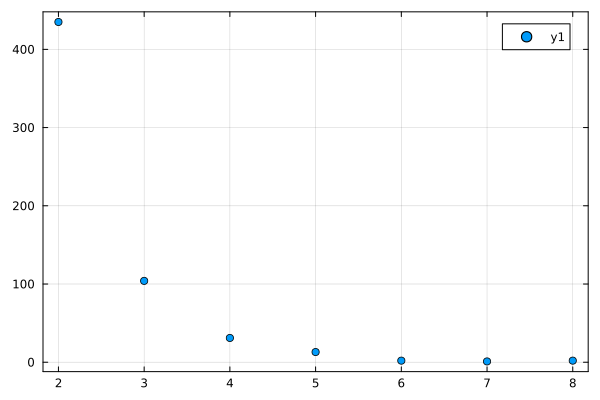

In [58]:
scatter(counter(lpath1))

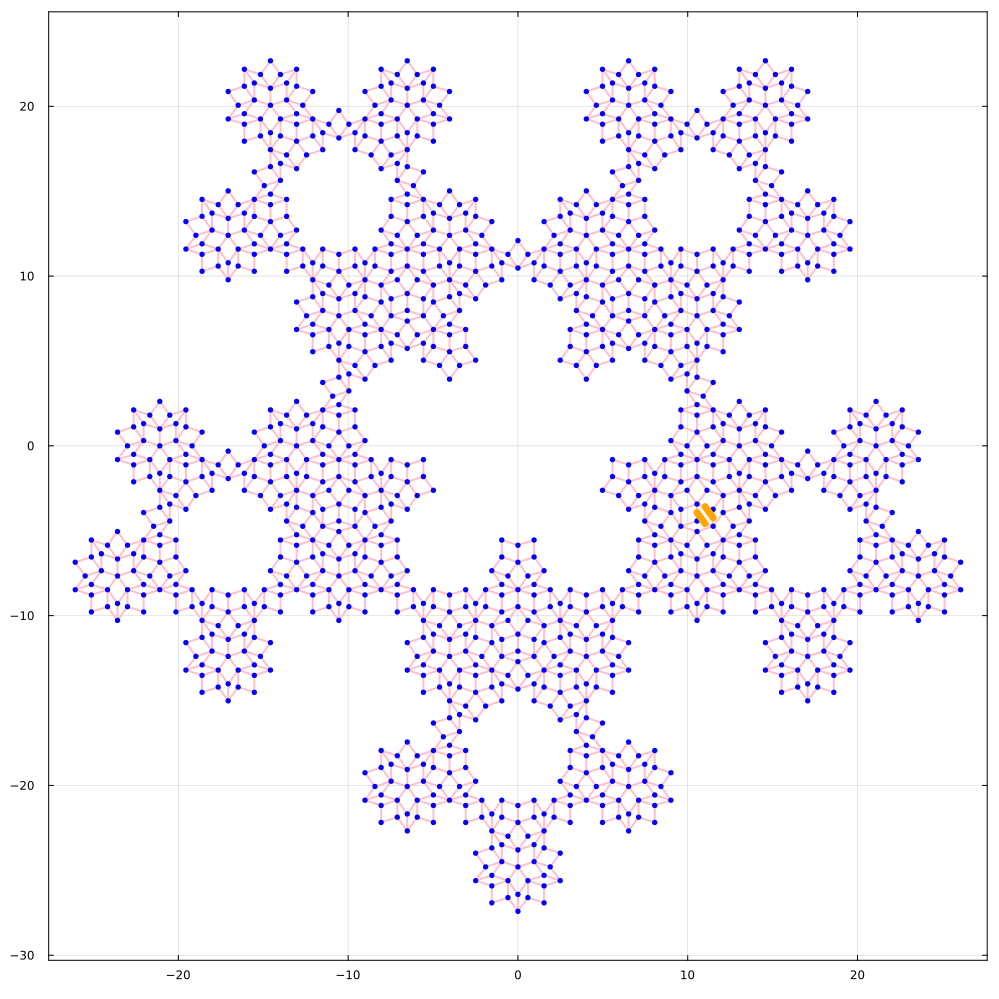

In [59]:
p = plot_generate(1000)
p = plot_edges(p,sub_penrose, "pink",2)

p = plot_sites(p,sub_penrose;markersize=3)
i = rand(1:8)
p = plot_path(p,mfmpath[1][i][:,1], sub_penrose_spin)
p = plot_path(p,mfmpath[2][i][:,1], sub_penrose_spin)

In [60]:
i

2

In [61]:
function post_process_mfm(mfm_arr, mfmpath)
    mfmnum1, mfmnum2 = mfmpath
    mat = (mfm_arr[1] .* mfm_arr[2] ./ mfm_arr[3])
    num1 = []
    num2 = []
    den = []
    corr = []
    dist = []
    npath = size(mfm_arr[1])[2]
    for i in 1:npath
        n1 = mean(mfm_arr[1][:,i])
        n2 = mean(mfm_arr[2][:,i])
        de = mean(mfm_arr[3][:,i])
        push!(num1, n1)
        push!(num2, n2)
        push!(den, de)
        push!(dist, size(mfmpath[1][i])[1] + size(mfmpath[2][i])[1])
        push!(corr, n1*n2/de)
    end
    return dist, num1, num2, den, corr
end

post_process_mfm (generic function with 1 method)

# Vison FM | Mobile

In [62]:
# vfmnum_basis1 = [[566, 558, 583],
# [567, 563, 557, 549, 551, 574],
# [607, 603, 604, 606, 605, 565, 564, 556, 548, 554, 552, 553, 550],
# [600, 598, 599, 601, 602, 615, 614, 613, 562, 555, 560, 588, 587, 594, 595, 590, 572]
# ]
# vfmnum_basis2 = [[585, 584],
# [576, 676, 674, 672, 569, 568],
# [ 570, 575, 675, 678, 677, 679, 673, 671, 669, 670, 655, 656, 654],
# [573, 571, 578, 645, 643, 644, 649, 648, 680, 681, 664, 663, 662, 666, 667, 668, 653, 652]
# ]

vfmnum_basis1 = [
    [577, 579, 582],
    [571, 573, 593, 790, 786],
    [570,550, 572, 591, 798, 788, 785, 779],
    [574, 551, 549, 548, 554, 552, 553, 590, 592, 801, 800, 802, 796, 797, 799, 789, 787, 780, 778, 777],
    [663, 671, 672, 584, 585, 583, 558, 557, 556, 555, 560, 588, 587, 594, 595, 597, 596, 813, 814, 807, 803, 804, 805, 792, 793],
    [290, 293, 335, 337, 520, 517, 518, 512, 510, 499, 498, 501],
    [365, 368, 449, 498, 499, 497, 496, 478, 477, 483, 484, 464, 461, 469],
    [786, 738, 736, 737, 742, 741, 794, 795, 762, 758, 760, 759, 490, 491, 489, 488, 472, 473, 471, 475, 514, 502, 496, 497, 499, 498, 449, 368, 365, 366, 377, 409, 410, 325, 323],
    [367, 366, 376, 378, 412, 411, 413, 398, 393, 395, 396],
    [321, 322, 509, 507, 508, 512, 511, 524, 523, 529, 545, 544, 542, 543, 435, 434, 429, 428, 430, 431, 173, 171, 162, 161, 159, 160, 165, 166, 283, 282, 284, 285, 269]
]
vfmnum_basis2 = [
    [581, 580],
    [738, 635, 633, 645, 578],
    [736, 634, 631, 632, 643,675, 575],
    [783, 781, 782, 737, 735, 640, 639, 641, 638, 636, 637, 642, 644, 678, 677, 679, 673, 674, 676, 576],
    [791, 784, 776, 775, 765, 766, 795, 794, 741, 742, 740 ,739, 732, 733, 630, 627, 624, 623, 646, 647, 649, 648, 680, 681, 664],
    [455, 453, 374, 365, 371, 381, 383, 412, 409, 410, 325, 323, 291],
    [468, 524, 516,518, 517, 331, 312, 290, 291, 323, 325, 410, 409, 377, 366],
    [291, 290, 312, 313, 319, 322, 505, 504, 506, 510, 503, 495, 494, 492, 483, 482, 480, 481, 486, 487, 768, 767, 769, 770 ,771, 751, 748, 756, 755, 754, 784, 791, 787, 785],
    [403, 404, 309, 306, 298, 323, 314, 310, 311, 317, 320],
    [263, 255, 261, 259, 260, 45, 43, 6, 5, 7, 1, 9, 17, 66, 65, 63, 64, 69, 70, 351, 350, 352, 353, 304, 296, 297, 298, 323, 314, 310, 311, 317, 320]
]
vfmnum1::Vector{Matrix{Int64}} = basis_path_to_all_path(vfmnum_basis1, sub_penrose_spin.pts)
vfmnum2::Vector{Matrix{Int64}} = basis_path_to_all_path(vfmnum_basis2, sub_penrose_spin.pts)
npath = length(vfmnum1)
lpath1 = [size(vfmnum1[i])[1] for i in 1:npath]
lpath2 = [size(vfmnum2[i])[1] for i in 1:npath]
vfmpath = [vfmnum1, vfmnum2]

2-element Vector{Vector{Matrix{Int64}}}:
 [[577 803 … 92 1257; 579 805 … 94 1259; 582 808 … 97 1262], [571 797 … 86 1251; 573 799 … 88 1253; … ; 790 566 … 336 1020; 786 335 … 332 789], [570 796 … 85 1250; 550 753 … 42 1207; … ; 785 565 … 331 1019; 779 322 … 325 776], [574 800 … 89 1254; 551 754 … 43 1208; … ; 778 321 … 324 775; 777 326 … 323 780], [663 893 … 188 1347; 671 906 … 201 1360; … ; 792 568 … 338 1022; 793 569 … 339 1023], [290 995 … 2106 1449; 293 998 … 2109 1452; … ; 498 1155 … 2260 1609; 501 1158 … 2263 1612], [365 1047 … 2158 1501; 368 1050 … 2161 1504; … ; 461 913 … 208 1367; 469 1135 … 2240 1589], [786 335 … 332 789; 738 535 … 284 989; … ; 325 776 … 65 1230; 323 780 … 69 1234], [367 1049 … 2160 1503; 366 1048 … 2159 1502; … ; 395 1083 … 2188 1537; 396 1084 … 2189 1538], [321 778 … 67 1232; 322 779 … 68 1233; … ; 285 990 … 2101 1444; 269 974 … 2085 1428]]
 [[581 807 … 96 1261; 580 806 … 95 1260], [738 535 … 284 989; 635 855 … 150 1309; … ; 645 867 … 162 1321; 578 804 … 93

In [63]:
[lpath1 , lpath2]

2-element Vector{Vector{Int64}}:
 [3, 5, 8, 20, 25, 12, 14, 35, 11, 33]
 [2, 5, 7, 20, 25, 13, 15, 34, 11, 33]

In [64]:
# siz = 3000
# p = plot(size = (siz,siz), aspect_ratio = :equal , legend = false)#, ylim = (-3, 20), xlim=(5,25))
# # p = plot_generate(700)
# plot_edges(p,sub_penrose)
# plot_sites(p, sub_penrose_spin, :blue, 0; annotate = false, markersize=  1)
# # plot_edges(p,sub_penrose_spin, "purple", 2)
# i = 4
# for i in length(vfmnum_basis1)-2:length(vfmnum_basis1)
#     # sub_plot_path(p,vfmnum_basis1[i])
#     sub_plot_path(p,vfmnum1[i][:,i])
#     sub_plot_path(p,vfmnum2[i][:,i])
#     # sub_plot_path(p,vfmnum_basis2[i])
# end
# # plot_sub_config(p,sub_config)
# # display(p)
# savefig(p,"./images/del/foovfm1.png")

In [65]:
function vis_fm(config::Vector{Int64}, num1::Matrix{Int64}, num2::Matrix{Int64}, 
                den::Matrix{Int64}, vfmnum1::Vector{Matrix{Int64}}, vfmnum2::Vector{Matrix{Int64}}, 
                npath::Int64, lpath1::Vector{Int64}, lpath2::Vector{Int64})
    for i in 1:npath
        for j in 1:10
            c1 = 1
            for k in 1:lpath1[i]
                if config[vfmnum1[i][k,j]] < 0
                    c1 = -c1
                end
            end
            num1[j,i] = num1[j,i] + c1
            c2 = 1
            for k in 1:lpath2[i]
                if config[vfmnum2[i][k,j]] < 0
                    c2 = -c2
                end
            end
            num2[j,i] = num2[j,i] + c2
            if c1 == c2 
                den[j,i] = den[j,i] + 1
            else
                den[j,i] = den[j,i] - 1
            end
        end
    end
end

vis_fm (generic function with 1 method)

In [66]:
# function check_good_vison_path(path, plaq)
#     nplaq = size(plaq)[1]
#     visit = fill(0,nplaq)
#     for pt in path
#         for j in 1:nplaq
#             if pt in plaq[j,:]
#                 visit[j] = visit[j] + 1
#             end
#         end
#     end
#     c = counter(visit)
#     if c[1] != 2
#         println("Error: More than 2 ones")
#         return false
#     elseif c[3] != 0
#         println("Error: Three exists")
#         return false
#     elseif c[4] != 0
#         println("Error: Four exists")
#         return false
#     end
#     return true
# end

# function check_good_vison_loop(visit)
#     c = counter(visit)
#     if c[1] != 0
#         println("Error: One exists")
#         return false
#     elseif c[3] != 0
#         println("Error: Three exists")
#         return false
#     elseif c[4] != 0
#         println("Error: Four exists")
#         return false
#     end
#     return true
# end

# for i in 1:length(vfmnum_basis2)
#     c1 = check_good_vison_path(vfmnum_basis1[i], sub_penrose_spin.plaq)
#     c2 = check_good_vison_path(vfmnum_basis2[i], sub_penrose_spin.plaq)
#     if c1 == false || c2 == false
#         println("Path $i is not good")
#     end
# end

In [ ]:
function check_good_vison_path(path, plaq)
    nplaq = size(plaq)[1]
    visit = fill(0,nplaq)
    for pt in path
        for j in 1:nplaq
            if pt in plaq[j,:]
                visit[j] = visit[j] + 1
            end
        end
    end
    c = counter(visit)
    if c[1] != 2
        println("Error: More than 2 ones")
        return false
    elseif c[3] != 0
        println("Error: Three exists")
        return false
    elseif c[4] != 0
        println("Error: Four exists")
        return false
    end
    return true
end

function check_good_vison_loop(visit)
    c = counter(visit)
    if c[1] != 0
        println("Error: One exists")
        return false
    elseif c[3] != 0
        println("Error: Three exists")
        return false
    elseif c[4] != 0
        println("Error: Four exists")
        return false
    end
    return true
end



function generate_vfm_loop(l::Int64,vison_spins_graph_nbr::Vector{Vector{Int64}},spin_to_plaq::Vector{Vector{Int64}}, cplaq::Vector{Int64}, nspins::Int64, nplaq::Int64, visit::Vector{Int64}, Ntries::Int64=100)
    start = rand(1:nspins)
    counter = l
    path = [start, rand(vison_spins_graph_nbr[start])]
    if cplaq[path[1]] <2 || cplaq[path[2]] < 2
        return []
    end
    for i in 1:nplaq
        visit[i] = 0
    end
    for p in spin_to_plaq[path[1]]
        visit[p] += 1
    end
    for p in spin_to_plaq[path[2]]
        visit[p] += 1
    end
    for i in 1:Ntries
        current_pt = path[end]
        previous_pt = path[end-1]
        rnbr = shuffle(vison_spins_graph_nbr[current_pt])
        for next_pt in rnbr
            if next_pt != previous_pt
                if next_pt in path
                    push!(path, next_pt)
                    counter = counter - 1
                    temp = [pop!(path)]
                    while length(path) > 0
                        new_pt = pop!(path)
                        if new_pt == next_pt
                            return temp
                            # return temp, visit
                        else
                            push!(temp, new_pt)
                        end
                    end
                    return path
                    # return path, visit
                else
                    p = spin_to_plaq[next_pt]
                    if length(p)<2
                        break
                    end
                    if visit[p[1]] > 1 || visit[p[2]] > 1
                        break
                    end
                    push!(path, next_pt)
                    counter = counter - 1
                    visit[p[1]] = visit[p[1]] + 1
                    visit[p[2]] = visit[p[2]] + 1
                    break
                end
            end
        end
        if counter < 0 
            return []
        end
        
    end
    return  []
end

function generate_vbasis(vison_spins_graph_nbr::Vector{Vector{Int64}}, spin_to_plaq::Vector{Vector{Int64}}, len::Vector{Int64})
    Ncalls = 1000 # 1000*100*200
    result_list = []
    nspins = length(vison_spins_graph_nbr)
    nplaq = size(plaq)[1]
    visit = fill(0,nplaq)

    for i in 1:Ncalls
        result = generate_vfm_loop(100, vison_spins_graph_nbr, spin_to_plaq,  len, nspins, nplaq, visit)
        if result != []
            push!(result_list, result)
        end
    end
    return [res for res in result_list]
end

function generate_vfnumbasis(vbasis, sub_penrose_spin)
    Npth = 110
    vfmnum_basis1 = []
    vfmnum_basis2 = []
    cntr = counter(length.(vbasis))
    good_length = []
    for i in 4:maximum(length.(vbasis))
        if cntr[i] > Npth
            push!(good_length, i)
        end
    end
    println(good_length)
    acc = fill(0,maximum(length.(vbasis)))
    for i in 1:length(vbasis)
        lcurrpath = length(vbasis[i])
        if lcurrpath in good_length
            if acc[lcurrpath] < Npth
                pth1, pth2 = split_loop(vbasis[i])
                push!(vfmnum_basis1, pth1)
                push!(vfmnum_basis2, pth2)
                acc[lcurrpath] += 1
                if length(pth1) + length(pth2) != lcurrpath
                    println("cry")
                end
            end
        end
    end
    vfmnum_basis1 = convert_to_int(vfmnum_basis1)
    vfmnum_basis2 = convert_to_int(vfmnum_basis2)
    
    vfmnum1::Vector{Matrix{Int64}} = basis_path_to_all_path(vfmnum_basis1, sub_penrose_spin.pts)
    vfmnum2::Vector{Matrix{Int64}} = basis_path_to_all_path(vfmnum_basis2, sub_penrose_spin.pts)
    npath = length(vfmnum1)
    lpath1 = [size(vfmnum1[i])[1] for i in 1:npath]
    lpath2 = [size(vfmnum2[i])[1] for i in 1:npath]
    vfmpath = [vfmnum1, vfmnum2]
    return vfmnum_basis1, vfmnum_basis2, vfmpath, lpath1, lpath2, npath
end


generate_vfnumbasis (generic function with 1 method)

In [68]:
@time vbasis = generate_vbasis(vison_spins_graph_nbr, convert_to_int(spin_to_plaq), length.(spin_to_plaq))
;

111.279199 seconds (1.80 G allocations: 96.725 GiB, 12.07% gc time)


In [69]:
vfmnum_basis1, vfmnum_basis2, vfmpath, lpath1, lpath2, npath = generate_vfnumbasis(vbasis, sub_penrose_spin)
vfmnum1, vfmnum2 = vfmpath;

Any[4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48]


In [70]:
vfmnum1

4950-element Vector{Matrix{Int64}}:
 [1223 58 … 769 312; 1220 55 … 766 315]
 [1759 1993 … 1305 146; 1773 1780 … 1319 160; 1774 1782 … 1320 161]
 [153 1312 … 2000 1766; 97 1262 … 1944 1716]
 [1465 2122 … 1011 306; 1618 2269 … 1164 507]
 [1352 193 … 898 667; 1357 198 … 903 451; 1394 235 … 940 483]
 [1455 2112 … 1001 296; 1456 2113 … 1002 297; … ; 1603 2254 … 1149 492; 1430 2087 … 976 271]
 [2039 1827 … 1585 2236; 1822 1820 … 1368 209; 1818 1818 … 1364 205]
 [1747 1981 … 1293 134; 1693 1927 … 1239 74; … ; 1696 1692 … 1242 77; 1697 1694 … 1243 78]
 [14 1179 … 1884 1633; 245 1404 … 2061 1858; 257 1416 … 2073 1870]
 [1078 390 … 624 844; 1065 377 … 611 831; 1063 375 … 609 829]
 ⋮
 [82 1247 … 1931 1701; 70 1235 … 1924 1689; … ; 2142 1485 … 1711 1939; 2141 1484 … 1710 1938]
 [1317 158 … 863 643; 1318 159 … 864 644; … ; 1242 77 … 788 330; 1473 2130 … 1019 331]
 [618 838 … 133 1292; 619 839 … 134 1293; … ; 349 1031 … 2142 1485; 351 1033 … 2144 1487]
 [614 834 … 129 1288; 616 836 … 131 1290; … ; 4

In [71]:
temp = [[vfmnum_basis1[i][j] for j in 1:length(vfmnum_basis1[i])] for i in 1:length(vfmnum_basis1)]

4950-element Vector{Vector{Int64}}:
 [1223, 1220]
 [1759, 1773, 1774]
 [153, 97]
 [1465, 1618]
 [1352, 1357, 1394]
 [1455, 1456, 1605, 1606, 1604, 1603, 1430]
 [2039, 1822, 1818]
 [1747, 1693, 1690, 1691, 1699, 1683, 1671, 1674, 1688, 1686, 1687, 1681, 1682, 1696, 1697]
 [14, 245, 257]
 [1078, 1065, 1063]
 ⋮
 [82, 70, 65, 64, 66, 55, 53, 56, 57, 2125  …  2187, 2153, 2152, 2161, 2162, 2166, 2143, 2144, 2142, 2141]
 [1317, 1318, 1262, 1261, 1260, 1258, 1278, 1280, 1271, 1276  …  1288, 1289, 1286, 1292, 1297, 1240, 1239, 1226, 1242, 1473]
 [618, 619, 335, 420, 418, 419, 422, 400, 397, 388  …  405, 407, 435, 436, 429, 427, 356, 348, 349, 351]
 [614, 616, 592, 608, 611, 617, 580, 575, 583, 582  …  631, 419, 422, 399, 415, 405, 407, 435, 436, 428]
 [1491, 1484, 1485, 1487, 1506, 1505, 1499, 1500, 1524, 1522  …  1223, 1220, 1217, 1229, 1230, 1235, 1237, 1289, 1288, 1302]
 [1490, 1560, 1561, 1559, 1492, 1483, 1515, 1505, 1504, 1495  …  1472, 1470, 1224, 1235, 1247, 1289, 1286, 1287, 1285, 1283

In [72]:
kk = [[1, 2, 3], [4, 5]]

2-element Vector{Vector{Int64}}:
 [1, 2, 3]
 [4, 5]

In [73]:
function cint(vec)
    temp = fill(Int64[], length(vec))
    for i in 1:length(vec)
        temp2 = fill(0, length(vec[i]))
        for j in 1:length(vec[i])
            temp2[j] = vec[i][j]
        end
    temp[i] = temp2
    end
    return temp
end

cint (generic function with 1 method)

In [78]:
convert_to_int(vfmnum_basis1)

MethodError: MethodError: no method matching convert_to_int(::Vector{Vector{Int64}})
The function `convert_to_int` exists, but no method is defined for this combination of argument types.

Closest candidates are:
  convert_to_int(!Matched::Vector{Any})
   @ Main ~/umd/acad/projects/quasicrystals/penrose/common_functions.jl:66
  convert_to_int(!Matched::Vector{Vector{Any}})
   @ Main ~/umd/acad/projects/quasicrystals/penrose/common_functions.jl:55


In [79]:
#  save("./data/vfm_paths_$ngen $spin_origin.jld","vbasis",vbasis)

In [81]:
# vbasis1 =  load("./data/vfm_paths_$ngen $spin_origin.jld")["vfmpath"]

In [84]:
# vfmnum1, vfmnum2 = vbasis1;

In [85]:
ll = []
for i in 1:length(vfmnum1)
    push!(ll, size(vfmnum1[i])[1])
end

In [94]:
counter(ll)

Accumulator{Any, Int64} with 23 entries:
  5  => 220
  16 => 220
  20 => 220
  12 => 220
  24 => 110
  8  => 220
  17 => 220
  23 => 220
  19 => 220
  22 => 220
  6  => 220
  11 => 220
  9  => 220
  14 => 220
  3  => 220
  7  => 220
  4  => 220
  15 => 220
  13 => 220
  ⋮  => ⋮

In [95]:
# vbasis =  load("./data/vfm_paths_$ngen $spin_origin.jld")["vbasis"]

In [96]:
#  save("./data/paper/vfm_paths_$ngen $spin_origin.jld","vfmpath",vfmpath)

In [97]:
#  save("./data/paper/vfm_paths_$ngen $spin_origin.jld","vfmpath",vfmpath)
# vfmpath = load("./data/paper/vfm_paths_$ngen $spin_origin.jld")["vfmpath"]
# vfmnum1, vfmnum2 = vfmpath;

In [98]:
# for i in 1:length(vfmnum_basis2)
#     c1 = check_good_vison_path(vfmnum_basis1[i], sub_penrose_spin.plaq)
#     c2 = check_good_vison_path(vfmnum_basis2[i], sub_penrose_spin.plaq)
#     if c1 == false || c2 == false
#         println("Path $i is not good")
#     end
# end

In [99]:
siz = 3000
p = plot(size = (siz,siz), aspect_ratio = :equal , legend = false)#, ylim = (-3, 20), xlim=(5,25))
# p = plot_generate(700)
plot_edges(p,sub_penrose)
plot_sites(p, sub_penrose_spin, :blue, 0; annotate = false, markersize=  1)
# plot_edges(p,sub_penrose_spin, "purple", 2)
j = 4
for i in length(vfmnum1)-4:length(vfmnum1)-3
    # sub_plot_path(p,vfmnum_basis1[i])
    sub_plot_path(p,vfmnum1[i][:,j])
    sub_plot_path(p,vfmnum2[i][:,j])
    # sub_plot_path(p,vfmnum_basis2[i])
end
# plot_sub_config(p,sub_config)
# display(p)
savefig(p,"./images/del/foovfm1.png")

"/Users/jeet/umd/acad/projects/quasicrystals/penrose/images/del/foovfm1.png"

In [100]:
function post_process_vfm(vfm_arr, vfmpath)
    cbin = []
    fmbin = []
    dbin = []
    ebin = []

    num1, num2, den = vfm_arr
    num_path1, num_path2 = vfmpath
    fm = sqrt.( abs.(num1 .* num2 ./ den) )
    println(size(fm))
    mean1, mean2, mean_den, mean_fm = mean(abs.(num1), dims=1), mean(abs.(num2), dims=1), mean(abs.(den), dims=1), mean(fm, dims=1)
    # std_fm = std(fm, dims=1)
    disnum = []
    cnum = [] 
    # cnum1 = []
    # cnum2 = []
    disden = []
    cden = []

    for i in 1:length(num_path1)
        push!(disnum, size(num_path1[i])[1])
        # push!(cnum1, mean1[1,i])
        push!(cnum, mean1[1,i])
        push!(disnum, size(num_path2[i])[1])
        # push!(cnum2, mean2[1,i])
        push!(cnum, mean2[1,i])

        push!(disden, size(num_path1[i])[1]+ size(num_path2[i])[1])
        push!(cden, mean_den[1,i])
    end
    return disnum, cnum,  disden, cden
    # return disnum, cnum1, cnum2,  disden, cden
end

function post_process_vfm_asymmetric(vfm_arr, vfmpath)
    cbin = []
    fmbin = []
    dbin = []
    ebin = []

    num1, num2, den = vfm_arr
    num_path1, num_path2 = vfmpath
    fm =  sqrt.( abs.(num1 .* num2 ./ den) )
    println(size(fm))
    # mean1, mean2, mean_den, mean_fm = mean(abs.(num1), dims=1), mean(abs.(num2), dims=1), mean(abs.(den), dims=1), mean(fm, dims=1)
    # std_fm = std(fm, dims=1)
    disnum = []
    cnum = [] 
    cnum1 = []
    cnum2 = []
    disden = []
    cden = []
    dis = []
    c = []

    for i in 1:length(num_path1)
        for j in 1:10
            # push!(disnum, size(num_path1[i])[1])
            # # push!(cnum1, mean1[1,i])
            # push!(cnum, num1[j,i])
            # push!(disnum, size(num_path2[i])[1])
            # # push!(cnum2, mean2[1,i])
            # push!(cnum, num2[j,i])

            # push!(disnum, size(num_path1[i])[1])
            push!(cnum1, num1[j,i] )
            # push!(disnum, size(num_path2[i])[1])
            push!(cnum2, num2[j,i] )

            push!(disden, size(num_path1[i])[1]+ size(num_path2[i])[1])
            push!(cden, den[j,i])

            push!(dis, size(num_path1[i])[1]+ size(num_path2[i])[1])
            push!(c, sqrt( abs( num1[j,i] * num2[j,i] / den[j,i])) )
            # push!(c, fm[j,i])
        end
    end
    # return dis, abs.(c), disnum, abs.(cnum),  disden, abs.(cden)
    return dis, abs.(c), disden, abs.(cnum1), abs.(cnum2), abs.(cden)
end

function post_process_vfm_euclidean(vfm_arr, vfmpath, sub_penrose_spin)
    cbin = []
    fmbin = []
    dbin = []
    ebin = []

    num1, num2, den = vfm_arr
    num_path1, num_path2 = vfmpath
    fm = sqrt.( abs.(num1 .* num2 ./ den) )
    println(size(fm))
    mean1, mean2, mean_den, mean_fm = mean(abs.(num1), dims=1), mean(abs.(num2), dims=1), mean(abs.(den), dims=1), mean(fm, dims=1)
    # std_fm = std(fm, dims=1)
    disnum = []
    cnum = [] 
    # cnum1 = []
    # cnum2 = []
    disden = []
    cden = []
    pts = sub_penrose_spin.pts

    for i in 1:length(num_path1)
        p_start1 = num_path1[i][1,1]
        p_end1 = num_path1[i][end,1]
        d1 = abs(pts[p_start1] - pts[p_end1])
        push!(disnum, d1)
        push!(cnum, mean1[1,i])

        p_start2 = num_path2[i][1,1]
        p_end2 = num_path2[i][end,1]
        d2 = abs(pts[p_start2] - pts[p_end2])
        push!(disnum, d2)
        push!(cnum, mean2[1,i])

        push!(disden, (d1+d2)/2)
        push!(cden, mean_den[1,i])
    end
    return disnum, cnum,  disden, cden
    # return disnum, cnum1, cnum2,  disden, cden
end


function post_process_vfm_ratio(vfm_arr, vfmpath, sub_penrose_spin)
    num1, num2, den = vfm_arr
    num_path1, num_path2 = vfmpath
    # println(size(fm))
    mean1, mean2, mean_den = mean(abs.(num1), dims=1), mean(abs.(num2), dims=1), mean(abs.(den), dims=1)
    println(size(mean1), "\t sadfasd")
    fm =  abs.(mean1 .* mean2 ./ mean_den) 
    dis  = []
    c = []
    disnum = []
    cnum = [] 
    disden = []
    cden = []

    pts = sub_penrose_spin.pts
    println(size(fm), "\t size fm")

    for i in 1:length(num_path1)
        push!(disnum, size(num_path1[i])[1])
        # push!(cnum1, mean1[1,i])
        push!(cnum, mean1[1,i])
        push!(disnum, size(num_path2[i])[1])
        # push!(cnum2, mean2[1,i])
        push!(cnum, mean2[1,i])

        push!(disden, size(num_path1[i])[1]+ size(num_path2[i])[1])
        push!(cden, mean_den[1,i])

        push!(c, fm[1,i])
        push!(dis, size(num_path1[i])[1]+ size(num_path2[i])[1])
    end

    return dis,  c, disnum, cnum, disden, cden
    # return disnum, cnum1, cnum2,  disden, cden
end

post_process_vfm_ratio (generic function with 1 method)

In [101]:
function mc_mobile_sub_all(mc_steps::Int64, Nmix::Int64, config::Vector{Int64} ,  plaq_spins::Matrix{Int64}, npts::Int64, sub_spins_lat_mat::Matrix{Int64}, nbr::Vector{Vector{Int64}} , paths::Vector{Vector{Int64}}, mega_path::Vector{Matrix{Int64}}, vfmpath::Vector{Vector{Matrix{Int64}}}, mfmpath::Vector{Vector{Matrix{Int64}}}, cap::Array{Int64, 3}, sub_spin_nbr::Vector{Vector{Int64}})
    nplaq::Int64 = size(plaq_spins)[1]
    nspins::Int64 = length(config)
    sz_corr_array::Matrix{Int64} = fill(0,nspins, nspins)
    sz_avg::Vector{Int64} = fill(0,nspins)
    npaths::Int64 = length(paths)
    lpath::Vector{Int64} = length.(paths)
    vis_corr_array::Vector{Matrix{Int64}} = [fill(0,lpath[i], lpath[i]) for i in 1:npaths]
    vis_corr_array_2::Vector{Matrix{Int64}} = [ fill(0,size(mega_path[i])[1],10) for i in 1:length(mega_path) ]
    nmegapaths::Int64 = length(mega_path)
    lmegapath::Vector{Int64} = [size(mega_path[i])[1] for i in 1:nmegapaths]
    
    vfmnum1 = vfmpath[1]
    vfmnum2 = vfmpath[2]
    vfmnpath = length(vfmnum1)
    vfmlpath1 = [size(vfmnum1[i])[1] for i in 1:vfmnpath]
    vfmlpath2 = [size(vfmnum2[i])[1] for i in 1:vfmnpath]
    num1 = fill(0,10,vfmnpath)
    num2 = fill(0,10,vfmnpath)
    den = fill(0,10,vfmnpath)

    mfmnum1 = mfmpath[1]
    mfmnum2 = mfmpath[2]
    mnpath = length(mfmnum1)
    m_num1 = fill(0,10,mnpath)
    m_num2 = fill(0,10,mnpath)
    m_den = fill(0,10, mnpath)
    m_lpath1 = [size(mfmnum1[i])[1] for i in 1:mnpath]
    m_lpath2 = [size(mfmnum2[i])[1] for i in 1:mnpath]

    s1::Int64 = 0
    s2::Int64 = 0
    s3::Int64 = 0
    s4::Int64 = 0

    random_plaq::Int64 = 0

    for i in 1:mc_steps
        for j in 1:Nmix
            while !monomer_move(config, npts, sub_spins_lat_mat,nbr)
            end
            while !plaq_move(config, nplaq, plaq_spins )
            end
        end
        # sz_avg .= sz_avg .+ config
        # sz_correlator_mat(config, sz_corr_array, nspins)
        # vis_partial(config, vis_corr_array_2, nmegapaths,lmegapath,  mega_path)
        # vis_fm(config, num1, num2, den, vfmnum1, vfmnum2,vfmnpath, vfmlpath1, vfmlpath2 )
        mon_fm(config, m_num1, m_num2, m_den, mfmnum1, mfmnum2, mnpath, m_lpath1, m_lpath2, cap, sub_spin_nbr)
    end

    sz_corr_array_float= sz_corr_array/mc_steps
    sz_avg_float = sz_avg/mc_steps
    vis_corr_array_float = vis_corr_array_2/mc_steps
    vfm_arr_float = [num1, num2, den] ./ mc_steps
    mfm_arr_float = [m_num1, m_num2, m_den] ./ mc_steps
    return sz_avg_float, (sz_corr_array_float+sz_corr_array_float')+I, vis_corr_array_float, (vfm_arr_float), mfm_arr_float, config
end
;

In [102]:
mc_steps = 1000*1
Nmix = 500
sub_config = get_sub_config( reset_config(max_match) )
@time sz1, szsz1, vison1, vfm_arr, mfm_arr, sub_config1 = mc_mobile_sub_all(mc_steps, Nmix, sub_config ,  sub_penrose_spin.plaq , sub_npts, sub_spins_lat_mat, get_sub_neighbors(sub_penrose), paths, mega_path, vfmpath, mfmpath, cap, convert_to_int(sub_spin_nbr));
# symmetrise_vison(vison1, length.(paths), length(paths))

  0.465893 seconds (15.16 k allocations: 171.196 MiB)


([0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0  …  0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [1.0 0.0 … 0.0 0.0; 0.0 1.0 … 0.0 0.0; … ; 0.0 0.0 … 1.0 0.0; 0.0 0.0 … 0.0 1.0], [[0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0; … ; 0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0], [0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0; … ; 0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0], [0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0; … ; 0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0], [0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0; … ; 0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0], [0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0; … ; 0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0], [0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0; … ; 0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0], [0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0; … ; 0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0], [0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0; … ; 0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0], [0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0; … ; 0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0], [0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0; … ; 0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0

In [104]:
count1 = 0
for i in 1:size(mfm_arr[1])[2]
    if mfm_arr[1][1,i] == 0.0 
        count1 = count1 + 1
    end
end

In [105]:
mfm_arr[1]

10×588 Matrix{Float64}:
 0.127  0.023  0.0  0.124  0.0  0.093  …  0.0  0.028  0.0  0.003  0.0  0.001
 0.137  0.027  0.0  0.135  0.0  0.098     0.0  0.03   0.0  0.002  0.0  0.001
 0.163  0.029  0.0  0.119  0.0  0.089     0.0  0.024  0.0  0.003  0.0  0.004
 0.136  0.033  0.0  0.129  0.0  0.117     0.0  0.033  0.0  0.001  0.0  0.002
 0.163  0.037  0.0  0.135  0.0  0.073     0.0  0.036  0.0  0.001  0.0  0.002
 0.145  0.03   0.0  0.13   0.0  0.078  …  0.0  0.026  0.0  0.003  0.0  0.002
 0.151  0.03   0.0  0.135  0.0  0.072     0.0  0.035  0.0  0.005  0.0  0.004
 0.147  0.023  0.0  0.124  0.0  0.086     0.0  0.027  0.0  0.003  0.0  0.002
 0.137  0.033  0.0  0.12   0.0  0.065     0.0  0.029  0.0  0.004  0.0  0.002
 0.14   0.028  0.0  0.098  0.0  0.09      0.0  0.027  0.0  0.002  0.0  0.006

In [106]:
mfm_arr[2]

10×588 Matrix{Float64}:
 0.145  0.024  0.0  0.154  0.0  0.145  0.0  …  0.0  0.012  0.001  0.0  0.006
 0.14   0.037  0.0  0.127  0.0  0.138  0.0     0.0  0.008  0.0    0.0  0.006
 0.128  0.031  0.0  0.169  0.0  0.162  0.0     0.0  0.009  0.002  0.0  0.005
 0.145  0.028  0.0  0.15   0.0  0.144  0.0     0.0  0.018  0.001  0.0  0.012
 0.134  0.03   0.0  0.147  0.0  0.157  0.0     0.0  0.006  0.001  0.0  0.012
 0.132  0.029  0.0  0.182  0.0  0.146  0.0  …  0.0  0.014  0.004  0.0  0.006
 0.13   0.026  0.0  0.156  0.0  0.166  0.0     0.0  0.015  0.002  0.0  0.008
 0.132  0.029  0.0  0.161  0.0  0.143  0.0     0.0  0.009  0.003  0.0  0.006
 0.147  0.031  0.0  0.133  0.0  0.141  0.0     0.0  0.016  0.004  0.0  0.012
 0.12   0.029  0.0  0.167  0.0  0.128  0.0     0.0  0.01   0.002  0.0  0.012

In [107]:
mfm_arr[3]

10×588 Matrix{Float64}:
 0.15   0.304  0.149  0.125  0.116  0.093  …  0.002  0.001  0.0    0.0  0.001
 0.127  0.308  0.155  0.14   0.15   0.094     0.003  0.001  0.0    0.0  0.0
 0.126  0.309  0.153  0.136  0.137  0.093     0.001  0.002  0.0    0.0  0.002
 0.139  0.336  0.157  0.117  0.141  0.086     0.0    0.0    0.0    0.0  0.003
 0.133  0.332  0.138  0.128  0.166  0.087     0.001  0.001  0.0    0.0  0.0
 0.139  0.316  0.163  0.126  0.167  0.081  …  0.004  0.001  0.0    0.0  0.003
 0.131  0.333  0.145  0.121  0.127  0.096     0.0    0.002  0.0    0.0  0.001
 0.136  0.318  0.144  0.111  0.133  0.095     0.002  0.001  0.001  0.0  0.001
 0.148  0.289  0.16   0.133  0.141  0.118     0.0    0.0    0.0    0.0  0.0
 0.13   0.305  0.184  0.129  0.14   0.11      0.003  0.0    0.0    0.0  0.0

In [108]:
mfmpath[1][1]

2×10 Matrix{Int64}:
 156  1315  641  861  1095  407  1549  2200  2003  1769
 157  1316  642  862  1096  408  1550  2201  2004  1770

In [ ]:
# total = 3
# sz = 1.8
# vis = 0.3
# visfm = 0.8
# monfm = 0.5

In [110]:
data_to_save = [[sz1, szsz1, vison1, vfm_arr, mfm_arr], [mc_steps, Nmix, sub_config ,  sub_penrose_spin.plaq , sub_npts, sub_spins_lat_mat, get_sub_neighbors(sub_penrose), paths, mega_path, vfmpath, mfmpath, cap, sub_spin_nbr]]
# save("./data/paper/paper_mc_run_all_corr_R3.jld","data_to_save",data_to_save)

2-element Vector{Vector{Any}}:
 [[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0  …  0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [1.0 0.0 … 0.0 0.0; 0.0 1.0 … 0.0 0.0; … ; 0.0 0.0 … 1.0 0.0; 0.0 0.0 … 0.0 1.0], [[0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0; … ; 0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0], [0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0; … ; 0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0], [0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0; … ; 0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0], [0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0; … ; 0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0], [0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0; … ; 0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0], [0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0; … ; 0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0], [0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0; … ; 0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0], [0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0; … ; 0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0], [0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0; … ; 0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0], [0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0; … 

In [ ]:
# loaded_data = load("./data/mc_run_all_corr.jld")["data_to_save"]
# sz1, szsz1, vison1, vfm_arr, mfm_arr = loaded_data[1]
# mc_steps, Nmix, sub_config ,  temp1 , sub_npts, sub_spins_lat_mat, temp2, paths, mega_path, vfmpath, mfmpath, cap, sub_spin_nbr = loaded_data[2];


## Sz

In [ ]:
clean_dist, clean_szsz_conn, dev = post_process_sz(szsz1, sz1, sub_spins_pos, 0.2)
# logdev = abs.( log.(clean_szsz_conn) .- log.(clean_szsz_conn .+ dev))

In [ ]:
p = scatter(clean_dist, log.(clean_szsz_conn), xlim=(0,8), ylim=(-9,-1))
sd, sc = distance_trim(clean_dist, log.(clean_szsz_conn), 0, 5)
@show c, m = linear_fit(sd, sc)
plot!(clean_dist, m.* clean_dist .+ c)


In [ ]:
exp(-8)^2

## Vison

In [ ]:
d, v, vdev = post_process_basic_vison(vison1, mega_path, sub_spins_pos)

In [ ]:
scatter(d, log.(v), yerr = logdev(v, vdev))

In [ ]:
d_trim, v_trim, dev_trim = distance_trim(d, v, vdev, 0.1,8)

In [ ]:
display(scatter(d_trim, log.(v_trim)))
linear_fit(d_trim, log.(v_trim))


In [ ]:
function distance_trim(d, c, dev, dmin, dmax)
    d_trim = []
    c_trim = []
    dev_trim = []
    for i in 1:length(d)
        if dmin <= d[i] <= dmax
            push!(d_trim, d[i])
            push!(c_trim, c[i])
            push!(dev_trim, dev[i])
        end
    end
    return d_trim, c_trim, dev_trim
end 


## Monomer FM

In [ ]:
dist, num1, num2, den, corr = post_process_mfm(mfm_arr, mfmpath)

In [ ]:
scatter(dist, corr)

In [ ]:
d, c = distance_average(dist, corr, 0.4)

In [ ]:
scatter(d, sqrt.(c), ylim=(-0.01,0.5), xlabel="Loop length", ylabel="Monomer FM", legend=false)

In [ ]:
d, c1, dev1 = distance_average_int(dist, num1)
d, c2, dev2 = distance_average_int(dist, num2)
d, cden, devden = distance_average_int(dist, den)

fit1 = linear_fit(d, log.(c1))
fit2 = linear_fit(d, log.(c2))
fitden = linear_fit(d, log.(cden))

p1 = scatter(d, log.(c1), yerr = logdev(c1, dev1), title = "MFM Numerator 1")
plot!(d, fit1[1] .+ fit1[2] .* d, label="slope="*string(fit1[2]))
p2 = scatter(d, log.(c2), yerr = logdev(c2, dev2), title = "MFM Numerator 2")
plot!(d, fit2[1] .+ fit2[2] .* d, label="slope="*string(fit2[2]))
pden = scatter(d, log.(cden), yerr = logdev(cden, devden), title = "MFM Denominator")
plot!(d, fitden[1] .+ fitden[2] .* d, label="slope="*string(fitden[2]))

display(p1)
display(p2)
display(pden)



## Vison FM

In [ ]:
# dis,  c, disnum, cnum, disden, cden = post_process_vfm_asymmetric(vfm_arr, vfmpath)
dis, c, disden, cnum1, cnum2, cden= post_process_vfm_asymmetric(vfm_arr, vfmpath)

In [ ]:
# δ1, γ1 = distance_average(dis, 2*log.(c))
# scatter(δ1, γ1)

In [ ]:
δ2, γ2 = distance_average_int(disden, log.(cnum1))
dd2, gg2 = distance_trim(δ2,γ2, -1,60)
@show intercept, slope = linear_fit(dd2, gg2)
scatter(δ2, γ2)
plot1 = plot!(δ2, slope .* δ2 .+ intercept, label="$slope x + $intercept", ylabel="Num1", xlabel="Loop length")
;

In [ ]:
δ3, γ3 = distance_average(disden, log.(cnum2))
dd3, gg3 = distance_trim(δ3,γ3, -1,60)
@show intercept, slope = linear_fit(dd3, gg3)
scatter(δ3, γ3)
plot2 = plot!(δ3, slope .* δ3 .+ intercept, label="$slope x + $intercept", ylabel="Num2", xlabel="Loop length")
;

In [ ]:
δ4, γ4 = distance_average(disden, log.(cden))
dd4, gg4 = distance_trim(δ4,γ4, 10,35)
@show intercept, slope = linear_fit(dd4, gg4)
scatter(δ4, γ4, ylim=(-9,0))
plot3 = plot!(δ4, slope .* δ4 .+ intercept, label="$slope x + $intercept", ylabel="Den", xlabel="Loop length");



In [ ]:
plot(plot1, plot2, plot3, layout=(2,2), size = (1000,800), left_margin=5Plots.mm, bottom_margin=5Plots.mm )

In [ ]:
dis_avg, c_avg = distance_average_int(dis, c)
scatter(dis_avg, c_avg, ylim=(0,0.5), xlabel="loop length", ylabel="Vison FM", legend=false)

# Moving monomers to boundary

In [ ]:
sub_config = get_sub_config( reset_config(max_match) )
config = sub_config
nbr = get_sub_neighbors(sub_penrose)
mon_site = get_monomer_sites(config, nbr, sub_spins_lat_mat)
println("Number of monomers = ", length(mon_site))
boundary_site = []
for i in 1:sub_penrose.n
    nbrs = sub_spin_nbr[i]
    if counter(cplaq[sub_spin_nbr[i]])[1] == 2
        push!(boundary_site,i)
    end
end
for b in boundary_site
    filter!(e->e≠b,mon_site) 
end  


In [ ]:
cno = sum(sub_penrose.adj;dims=1)[1,:];
norm( cno[mon_site] .- 3)

In [ ]:
length(mon_site)

In [ ]:
mon = mon_site[1]
mon_nbr = rand(sub_penrose_nbr[mon])


In [ ]:
nbr[mon_nbr]

In [ ]:
alternating_path_site = []
alternating_path_spin = []
for neighbor in nbr[mon_nbr]
    if config[sub_spins_lat_mat[neighbor, mon_nbr]] > 0
        push!(alternating_path_site, neighbor )
        push!(alternating_path_spin, sub_spins_lat_mat[neighbor, mon_nbr])
    end
end


In [ ]:
function get_alternating_path(config, mon_site_k)
    # for k in 1:10
        alternating_path_site = []
        alternating_path_spin = []
        mon = mon_site_k
        mon_nbr = rand(sub_penrose_nbr[mon])

        push!(alternating_path_site, mon_nbr)
        push!(alternating_path_spin, sub_spins_lat_mat[mon_nbr, mon])
        config_to_search = 1

        for l in 1:200
            last_site = alternating_path_site[end]
            if last_site ∈ boundaryB    
                # println("alternating path determined")
                return true, alternating_path_site, alternating_path_spin
                break
            end

            nbr_site = nbr[last_site]
            for neighbor in nbr_site
                if config[ sub_spins_lat_mat[last_site, neighbor] ] == config_to_search
                    config_to_search = -config_to_search
                    push!(alternating_path_spin,sub_spins_lat_mat[last_site, neighbor] )
                    push!(alternating_path_site, neighbor)
                    break
                end
            end
        end
        return false, alternating_path_site, alternating_path_spin
    # end


end


In [ ]:
function clean_monomer(config)
    mon_site = get_monomer_sites(config, nbr, sub_spins_lat_mat)
    for b in boundaryB
        filter!(e->e≠b,mon_site) 
    end 
    for mon_site_k in mon_site
        success, alternating_path_site, alternating_path_spin = get_alternating_path(config, mon_site_k)
        if success 
            for sp in alternating_path_spin
                config[sp] = -config[sp]
            end
        end
    end
    mon_site = get_monomer_sites(config, nbr, sub_spins_lat_mat)
    for b in boundaryB
        filter!(e->e≠b,mon_site) 
    end 
    return config, mon_site
end

    

In [ ]:
sub_config = get_sub_config( reset_config(max_match) )
config = sub_config
for i in 1:100
    config, mon_site = clean_monomer(config)
end

In [ ]:
mon_site = get_monomer_sites(config, nbr, sub_spins_lat_mat)
for b in boundaryB
    filter!(e->e≠b,mon_site) 
end
length(mon_site)

In [ ]:
subA = []
subB = []
for i in 1:sub_penrose.n
    pt = sub_penrose.pts[i]
    flag = false
    for j in 1:length(AtoG)
        if abs(pt - penrose.pts[AtoG[j]]) < 1e-5
            push!(subA, i)
            flag = true
            break
        end 
    end
    if !flag
        push!(subB, i)
    end
end
subA = [A for A in subA]
subB = [B for B in subB]
length(subA) + length(subB)

In [ ]:
p = plot_generate(1500)#,legend=false,ylim=(-10,10))
# plot_graph(p,sub_penrose, "pink", 2, :red)
plot_edges(p,sub_penrose)
plot_sub_config(p, config)
# for A in subA   
#     plot_single_point(p,sub_penrose.pts[A],:blue,5 )
# end
for B in mon_site   
    plot_single_point(p,sub_penrose.pts[B],:magenta,5 )
end
# display(p)
savefig(p,"./images/del/sub.png")

In [ ]:
sum([(mon_site[i] ∈ subB) for i in 1:length(mon_site)])

In [ ]:
boundaryA = []
boundaryB = []
for i in 1:length(boundary_site)
    if boundary_site[i] ∈ subA
        push!(boundaryA, boundary_site[i])
    else
        push!(boundaryB, boundary_site[i])
    end
end
boundaryA = convert_to_int(boundaryA)
boundaryB = convert_to_int(boundaryB)
;

In [ ]:
# good_config = deepcopy(config);

# Immobile monomers

In [ ]:
function get_monomer_sites(config::Vector{Int64}, nbr::Vector{Vector{Int64}}, sub_spins_lat_mat::Matrix{Int64})
    mon_list = []
    for i in 1:size(sub_spins_lat_mat)[1]
        nbr_sites = nbr[i]
        flag = true
        for j in nbr_sites
            if config[sub_spins_lat_mat[i, j]] == 1
                # there is a dimer
                flag = false
                break
            end
        end
        if flag
            push!(mon_list, i)
        end
    end
    return mon_list
end


function monomer_move(config::Vector{Int64}, npts::Int64, Gedge_no::Matrix{Int64}, nbrG::Vector{Vector{Int64}}, fixed_mon_loc::Vector{Int64})
    initial_site::Int64 = rand(1:npts)
    while (initial_site ∈ fixed_mon_loc)
        initial_site = rand(1:npts)
    end
    nbr_initial::Vector{Int64} = nbrG[initial_site]

    for i in nbr_initial
        if config[Gedge_no[initial_site, i]] == 1
            # there is a dimer
            return false
        end
    end

    # at this point, we know initial_site is a monomer
    special_nbr::Int64 = rand(nbr_initial)
    nnbr::Vector{Int64} = nbrG[special_nbr]
    for i in nnbr
        if config[Gedge_no[i,special_nbr]] == 1
            config[Gedge_no[i,special_nbr]] = -1
            config[Gedge_no[initial_site, special_nbr]] = 1
            return true
        end
    end
    return false
end

In [ ]:
function mc_immobile_sub_all(mc_steps::Int64, Nmix::Int64, config::Vector{Int64} , fixed_mon_loc::Vector{Int64}, plaq_spins::Matrix{Int64}, npts::Int64, sub_spins_lat_mat::Matrix{Int64}, nbr::Vector{Vector{Int64}} , paths::Vector{Vector{Int64}}, mega_path::Vector{Matrix{Int64}}, vfmpath::Vector{Vector{Matrix{Int64}}}, mfmpath::Vector{Vector{Matrix{Int64}}}, cap::Array{Int64, 3}, sub_spin_nbr::Vector{Vector{Int64}})

    nplaq::Int64 = size(plaq_spins)[1]
    nspins::Int64 = length(config)
    sz_corr_array::Matrix{Int64} = fill(0,nspins, nspins)
    sz_avg::Vector{Int64} = fill(0,nspins)
    npaths::Int64 = length(paths)
    lpath::Vector{Int64} = length.(paths)
    vis_corr_array::Vector{Matrix{Int64}} = [fill(0,lpath[i], lpath[i]) for i in 1:npaths]
    vis_corr_array_2::Vector{Matrix{Int64}} = [ fill(0,size(mega_path[i])[1],10) for i in 1:length(mega_path) ]
    nmegapaths::Int64 = length(mega_path)
    lmegapath::Vector{Int64} = [size(mega_path[i])[1] for i in 1:nmegapaths]
    
    vfmnum1 = vfmpath[1]
    vfmnum2 = vfmpath[2]
    vfmnpath = length(vfmnum1)
    vfmlpath1 = [size(vfmnum1[i])[1] for i in 1:vfmnpath]
    vfmlpath2 = [size(vfmnum2[i])[1] for i in 1:vfmnpath]
    num1 = fill(0,10,vfmnpath)
    num2 = fill(0,10,vfmnpath)
    den = fill(0,10,vfmnpath)

    mfmnum1 = mfmpath[1]
    mfmnum2 = mfmpath[2]
    mnpath = length(mfmnum1)
    m_num1 = fill(0,10,mnpath)
    m_num2 = fill(0,10,mnpath)
    m_den = fill(0,10, mnpath)
    m_lpath1 = [size(mfmnum1[i])[1] for i in 1:mnpath]
    m_lpath2 = [size(mfmnum2[i])[1] for i in 1:mnpath]

    s1::Int64 = 0
    s2::Int64 = 0
    s3::Int64 = 0
    s4::Int64 = 0

    random_plaq::Int64 = 0

    for i in 1:mc_steps
        for j in 1:Nmix
            while !monomer_move(config, npts, sub_spins_lat_mat,nbr, fixed_mon_loc)   # use this for partially fixed monomers
            end
            # while !monomer_move(config, npts, sub_spins_lat_mat,nbr) # use this for completely mobile monomers
            # end
            while !plaq_move(config, nplaq, plaq_spins )
            end
        end
        sz_avg .= sz_avg .+ config
        # sz_correlator_mat(config, sz_corr_array, nspins)
        # vis_partial(config, vis_corr_array_2, nmegapaths,lmegapath,  mega_path)
        # vis_fm(config, num1, num2, den, vfmnum1, vfmnum2,vfmnpath, vfmlpath1, vfmlpath2 )
        # mon_fm(config, m_num1, m_num2, m_den, mfmnum1, mfmnum2, mnpath, m_lpath1, m_lpath2, cap, sub_spin_nbr)
    end

    sz_corr_array_float= sz_corr_array/mc_steps
    sz_avg_float = sz_avg/mc_steps
    vis_corr_array_float = vis_corr_array_2/mc_steps
    vfm_arr_float = [num1, num2, den] ./ mc_steps
    mfm_arr_float = [m_num1, m_num2, m_den] ./ mc_steps
    return sz_avg_float, (sz_corr_array_float+sz_corr_array_float')+I, vis_corr_array_float, (vfm_arr_float), mfm_arr_float, config
end
;

In [ ]:
function randomise_monomers(config, npts, sub_spins_lat_mat,nbr)
    for i in 1:10000000
        while !monomer_move(config, npts, sub_spins_lat_mat,nbr)
        end
    end
    return config
end

In [ ]:
sub_config = get_sub_config( reset_config(max_match) )
sub_config2 = randomise_monomers(sub_config, sub_penrose.n, sub_spins_lat_mat,get_sub_neighbors(sub_penrose)  )
mon_sites = get_monomer_sites(sub_config2,get_sub_neighbors(sub_penrose), sub_spins_lat_mat)
ρfixed = 0.5
n_fixed_mon = Int64(round(length(mon_sites) * ρfixed))
fixed_mon_loc = shuffle(mon_sites)[1:n_fixed_mon]
fixed_mon_loc = [m for m in fixed_mon_loc];

In [ ]:
counter(cno[mon_sites])

In [ ]:
mc_steps = 1000*100
Nmix = 500
@time sz1, szsz1, vison1, vfm_arr, mfm_arr, sub_config1 = mc_immobile_sub_all(mc_steps, Nmix, config , fixed_mon_loc, sub_penrose_spin.plaq , sub_npts, sub_spins_lat_mat, convert_to_int(get_sub_neighbors(sub_penrose)), paths, mega_path, vfmpath, mfmpath, cap, convert_to_int(sub_spin_nbr));
# symmetrise_vison(vison1, length.(paths), length(paths))

In [ ]:
mfm_arr

In [ ]:
data_to_save = [[sz1, szsz1, vison1, vfm_arr, mfm_arr, sub_config1], [mc_steps, Nmix, config , fixed_mon_loc,  sub_penrose_spin.plaq , sub_npts, sub_spins_lat_mat, convert_to_int(get_sub_neighbors(sub_penrose)), paths, mega_path, vfmpath, mfmpath, cap, convert_to_int(sub_spin_nbr)]]
# save("./data/mc_run_vfm_70_percent_fixed.jld","data_to_save",data_to_save)

In [ ]:
# loaded_data = load("./data/mc_run_vfm_50_percent_fixed.jld","data_to_save") # ["data_to_save"]
# sz1, szsz1, vison1, vfm_arr, mfm_arr, sub_config1 = loaded_data[1]
# mc_steps, Nmix, config , fixed_mon_loc,  temp_plaq , sub_npts, sub_spins_lat_mat, temp1, paths, mega_path, vfmpath, mfmpath, cap,temp2 = loaded_data[2]

In [ ]:
vfm_arr

In [ ]:
p = plot_generate(1000)
plot_edges(p,sub_penrose)
# plot_edges(p,sub_penrose_spin, "purple", 2)
# sub_plot_path(p,paths[1])
# plot_sub_lat(p)
# plot_sub_config(p,sub_config)
count = 0
for i in 1:length(sub_config)
    if abs( sz1[i] - 1.0) < 1e-7
        plot_single_point(p, sub_penrose_spin.pts[i], :magenta,5)
        count += 1
    elseif abs( sz1[i] + 1.0) < 1e-7
        plot_single_point(p, sub_penrose_spin.pts[i], :magenta,5)
        count += 1
    end

end
# for i in mon_sites
#     if !(i ∈ fixed_mon_loc)
#         plot_single_point(p, sub_penrose.pts[i], :red,3)
#     end
# end
display(p)
savefig(p,"./images/del/frozen_spins50.png")

# Monte Carlo | Immobile monomers | Sub lattice

In [ ]:
sub_spin_origin = sub_spins_to_full_spins[spin_origin]

In [ ]:
p = plot_generate(6000)
plot_edges(p,sub_penrose)
plot_sites(p,sub_penrose,:red, 0; annotate=false, markersize=10)
# plot_sub_lat(p)
sub_config_initial = get_sub_config( reset_config(max_match) )
# plot_sub_config(p,sub_config_initial)

ms =10

for i in 1:sub_nspins
    if sub_config_initial[i] == 1
        a, b = spins_to_edges[sub_spins[i],:]
        ptA = AtoG[a]
        ptB = BtoG[b]
        plot!(p, [pts_x[ptA], pts_x[ptB]],[pts_y[ptA] , pts_y[ptB]], linecolor="black", linewidth=7)
        scatter!(p, [pts_x[ptA]], [pts_y[ptA]], mc=:blue, markerstrokewidth=0, markersize = ms)
        scatter!(p, [pts_x[ptB]], [pts_y[ptB]], mc=:green, markerstrokewidth=0, markersize = ms)
    end
end

plot_sites(p,sub_penrose_spin,:brown,0; annotate=true, markersize=1 )
# display(p)
savefig(p,"./images/del/sub_config.png")

In [ ]:
p = plot_generate(500)#,legend=false,ylim=(-10,10))
plot_graph(p,sub_penrose, "pink", 2, :red)
# plot_sub_config(p, get_sub_config(config))
# plot_single_point(p,sub_penrose_spin.pts[sub_spin_origin])


In [ ]:
function mc_immobile_sub_avg(mc_steps::Int64, Nmix::Int64, config::Vector{Int64} ,  plaq_spins::Matrix{Int64} )

    nplaq::Int64 = size(plaq_spins)[1]
    nspins::Int64 = length(config)
    sz_corr_array::Matrix{Int64} = fill(0,nspins, nspins)
    sz_avg::Vector{Int64} = fill(0,nspins)

    s1::Int64 = 0
    s2::Int64 = 0
    s3::Int64 = 0
    s4::Int64 = 0

    random_plaq::Int64 = 0

    for i in 1:mc_steps
        for j in 1:Nmix
            while true
                random_plaq = rand(1:nplaq)
                s1 = plaq_spins[random_plaq,1]
                s2 = plaq_spins[random_plaq,2]
                s3 = plaq_spins[random_plaq,3]
                s4 = plaq_spins[random_plaq,4]

                if config[s1] == 1 && config[s4] == 1
                    config[s1] = -1
                    config[s4] = -1
                    config[s2] = 1
                    config[s3] = 1
                    break
                elseif config[s3] == 1 && config[s2] == 1
                    config[s1] = 1
                    config[s4] = 1
                    config[s2] = -1
                    config[s3] = -1
                    break
                end
            end
        end
        #sz_avg .= sz_avg .+ config
        add_vec!(sz_avg, config)
        sz_correlator_mat(config, sz_corr_array, nspins)
    end

    sz_corr_array_float= sz_corr_array/mc_steps
    sz_avg_float = sz_avg/mc_steps

    return sz_avg_float, (sz_corr_array_float+sz_corr_array_float')/2+I
end
;

In [ ]:
mc_steps = 5*100*10
Nmix = 500
sub_config = get_sub_config( reset_config(max_match) )
@time sz, szsz = mc_immobile_sub_avg(mc_steps, Nmix, sub_config ,  sub_penrose_spin.plaq);

In [ ]:
d, c = post_process_sz(szsz, sz, sub_spins_pos,0.3)
# scatter(d, c);

# MC | Immobile | Vison 

In [ ]:
function mc_immobile_sub_avg_vis(mc_steps::Int64, Nmix::Int64, config::Vector{Int64} ,  plaq_spins::Matrix{Int64} , npaths::Int64, paths::Vector{Vector{Int64}}, mega_path::Vector{Matrix{Int64}})

    nplaq::Int64 = size(plaq_spins)[1]
    nspins::Int64 = length(config)
    
    sz_corr_array::Matrix{Int64} = fill(0,nspins, nspins)
    sz_avg::Vector{Int64} = fill(0,nspins)

    lpath::Vector{Int64} = length.(paths)
    vis_corr_array::Vector{Matrix{Int64}} = [fill(0,lpath[i], lpath[i]) for i in 1:npaths]
    vis_corr_array_2::Vector{Matrix{Int64}} = [ fill(0,size(mega_path[i])[1],10) for i in 1:length(mega_path) ]
    nmegapaths::Int64 = length(mega_path)
    lmegapath::Vector{Int64} = [size(mega_path[i])[1] for i in 1:nmegapaths]
    println(lmegapath)
    println("--------------")
    s1::Int64 = 0
    s2::Int64 = 0
    s3::Int64 = 0
    s4::Int64 = 0

    random_plaq::Int64 = 0

    for i in 1:mc_steps
        for j in 1:Nmix
            while true
                random_plaq = rand(1:nplaq)
                s1 = plaq_spins[random_plaq,1]
                s2 = plaq_spins[random_plaq,2]
                s3 = plaq_spins[random_plaq,3]
                s4 = plaq_spins[random_plaq,4]

                if config[s1] == 1 && config[s4] == 1
                    config[s1] = -1
                    config[s4] = -1
                    config[s2] = 1
                    config[s3] = 1
                    break
                elseif config[s3] == 1 && config[s2] == 1
                    config[s1] = 1
                    config[s4] = 1
                    config[s2] = -1
                    config[s3] = -1
                    break
                end
            end
        end
        sz_avg .= sz_avg .+ config
        # sz_correlator_mat(config, sz_corr_array, nspins)
        vis(config, vis_corr_array, npaths, lpath, paths)
        # vis_partial(config, vis_corr_array_2, nmegapaths,lmegapath,  mega_path)
        
    end

    # sz_corr_array_float = 0
    # sz_avg_float = 0

    sz_corr_array_float= sz_corr_array/mc_steps
    sz_avg_float = sz_avg/mc_steps

    #vis_corr_array_float = 0
    vis_corr_array_float = vis_corr_array_2/mc_steps

    return sz_avg_float, sz_corr_array_float+sz_corr_array_float'+I, vis_corr_array_float, config
end
;

In [ ]:
mc_steps = 10
Nmix = 500
sub_config = get_sub_config( reset_config(max_match) )
@time sz, szsz, vison, final_config = mc_immobile_sub_avg_vis(mc_steps, Nmix, sub_config ,  sub_penrose_spin.plaq, length(paths), paths, mega_path)
# symmetrise_vison(vison, length.(paths), length(paths))

In [ ]:

p = plot_generate(700)
plot_edges(p,sub_penrose)
# plot_edges(p,sub_penrose_spin, "purple", 2)
sub_plot_path(p,paths[1])
# plot_sub_lat(p)
# plot_sub_config(p,sub_config)
count = 0
for i in 1:length(sub_config)
    if abs( abs(sz[i]) - 1.0) < 1e-7
        plot_single_point(p, sub_penrose_spin.pts[i])
        count += 1
    end
end
display(p)
# savefig(p,"./images/del/vis"*string(count)*".png")

In [ ]:
# save("./data/"*string(ngen)*"immobile_config.jld","config", reset_config(max_match))


In [ ]:
dv, cv = post_process_vison_lite(vison, paths)
println(length(dv))

In [ ]:
count = 0
for i in 1
    for j in 1:size(vison[i])[1]-1
        for k in j+1:size(vison[i])[1]
            if abs( abs(vison[i][j,k]) - 1.0 ) < 1e-7
                p = plot_generate(700, ylim = (-10,10))
                plot_edges(p,sub_penrose)
                plot_edges(p,sub_penrose_spin, "purple", 2)
                sub_plot_path(p,paths[i])
                p1 = paths[i][j]
                p2 = paths[i][k]
                plot_single_point(p, sub_penrose_spin.pts[p1])
                plot_single_point(p, sub_penrose_spin.pts[p2])
                plot_sub_lat(p)
                plot_sub_config(p,sub_config)

                # savefig(p,"./images/del/vis"*string(count)*".png")
                count = count + 1
            end
        end
    end
end


In [ ]:
# save("./data/del.jld","dv", dv, "cv",cv)
# save("./data/"*string(ngen)*"_immobile_good_paths1.jld","sz", sz, "szsz", szsz, "vison", vison,"final_config", final_config, "sub_spins_pos", sub_spins_pos, "paths", paths, "ngen", ngen, "mc_steps",mc_steps, "Nmix", Nmix, "spin_origin", spin_origin)


In [ ]:
# ds, cs = post_process_sz(szsz, sz, sub_spins_pos,0.3)
# display(scatter(ds, log.(cs), xlim = (0,13)))
# dv, cv = post_process_vison(vison, paths,  averaging_radius = 0.4);

# MC | Mobile | Sz | Sub lattice

In [ ]:
dvfm, cvfm, err = post_process_vfm(vfm_arr, vfmpath)

In [ ]:
num1, num2, den = vfm_arr
num_path1, num_path2 = vfmpath
mean1, mean2, mean_den = mean(abs.(num1), dims=1), mean(abs.(num2), dims=1), mean(abs.(den), dims=1)

In [ ]:
scatter(dvfm, log.(mean1[1,:]))

In [ ]:
err

In [ ]:
scatter(dvfm, cvfm,title="Vison FM correlator", yerr = err[1,:])

In [ ]:
d, v = post_process_basic_vison(vison1, mega_path, sub_penrose_spin.pts)
scatter(d, log.(v))

In [ ]:
dbin, vbin, ebin = post_process_mobile_vison(vison1, mega_path, sub_penrose_spin.pts)
scatter(dbin, vbin)a

In [ ]:
siz = 1000
p = plot(size = (siz,siz), aspect_ratio = :equal , legend = false, ylim = (15,30), xlim = (0,10))
# p = plot_generate(700)
plot_edges(p,sub_penrose)
i = 4
sub_plot_path(p,vfmnum_basis[i])
sub_plot_path(p,vfmnum_m_basis[i])
# plot_sub_lat(p)
# plot_sub_config(p,sub_config)
# count = 0
# for i in 1:length(sub_config)
#     if abs( abs(sz1[i]) - 1.0) < 1e-7
#         plot_single_point(p, sub_penrose_spin.pts[i])
#         count += 1
#     end
# end
display(p)
# savefig(p,"./images/del/vis"*string(count)*".png")

In [ ]:
dv, cv = post_process_vison_lite(vison1, paths)

In [ ]:
scatter(dv, cv)

In [ ]:
# d, c = post_process_sz(szsz1, sz1, sub_spins_pos,0.4)
# scatter(d, log.(c))

In [ ]:
# d1, c1 = post_process_sz(szsz1, sz1, sub_spins_pos,0.4)
# display(scatter(d1, log.(c1)))
d2, v2 = post_process_vison(vison1, paths,  averaging_radius = 0.3);

In [ ]:
# save("./data/big_mobile_sz_sublattice.jld","sz", sz, "szsz", szsz, "mc_steps", mc_steps, "Nmix", Nmix, "averaging_distance", 0.3)
# save("./data/8_all_data.jld","sz", sz, "szsz", szsz, "vison", vison,  "sz1", sz1, "szsz1", szsz1, "vison1", vison1, "paths", paths, "ngen", ngen, "mc_steps",25000000, "Nmix", 1000, "mc_steps1",mc_steps,"Nmix1", Nmix, "averaging_distance", 0.4, "spin_origin", spin_origin)

In [ ]:
# save("./data/"*string(ngen)*"_mobile_good_paths_vison1.jld","sz", sz1, "szsz", szsz1, "vison", vison1,"final_config", sub_config1, "sub_spins_pos", sub_spins_pos, "paths", paths, "ngen", ngen, "mc_steps",mc_steps, "Nmix", Nmix, "spin_origin", spin_origin)

# Monomer operator

In [ ]:
function monomer_correlator( correlator_matrix::Matrix{Int64},sub_config::Vector{Int64}, sub_npts::Int64, sub_lat_nbr_spin::Vector{Vector{Int64}}, m_list::Vector{Int64} )
    for i in 1:sub_npts
        m_list[i] = (prod(-sub_config[sub_lat_nbr_spin[i]]) == 1)
    end
    for i in 1:sub_npts-1
        if m_list[i] == 1
            for j in i+1:sub_npts
                correlator_matrix[j,i] +=   m_list[j]
            end
        end
    end
end

function monomer_correlator1( correlator_matrix::Matrix{Int64},sub_config::Vector{Int64}, sub_npts::Int64, sub_lat_nbr_spin::Vector{Vector{Int64}}, m_list::Vector{Int64} )
    for i in 1:sub_npts
        m_list[i] = (prod(-sub_config[sub_lat_nbr_spin[i]]) == 1)
    end
    for i in 1:sub_npts-1
        if m_list[i] == 1
            for j in i+1:sub_npts
                correlator_matrix[j,i] +=   m_list[j]
            end
        end
    end
end

function monomer_average( monomer_avg::Vector{Int64}, sub_config::Vector{Int64}, sub_npts::Int64, sub_lat_nbr_spin::Vector{Vector{Int64}})
    for i in 1:sub_npts
        monomer_avg[i] += (prod(-sub_config[sub_lat_nbr_spin[i]]) == 1 )
    end
end



In [ ]:
monomer_avg::Vector{Int64} = fill(0,npts)
monomer_average( monomer_avg,sub_config, sub_npts, sub_lat_nbr_spin)

In [ ]:
function mc_mobile_sub_avg_monomer(mc_steps::Int64, Nmix::Int64, config::Vector{Int64} ,  plaq_spins::Matrix{Int64}, npts::Int64, sub_spins_lat_mat::Matrix{Int64}, nbr::Vector{Vector{Int64}}, sub_lat_nbr_spin::Vector{Vector{Int64}}  )
    nplaq::Int64 = size(plaq_spins)[1]
    nspins::Int64 = length(config)
    # sz_corr_array::Matrix{Int64} = fill(0,nspins, nspins)
    # sz_avg::Vector{Int64} = fill(0,nspins)

    # lpath::Vector{Int64} = length.(paths)
    # vis_corr_array::Vector{Matrix{Int64}} = [fill(0,lpath[i], lpath[i]) for i in 1:npaths]

    monomer_corr_array::Matrix{Int64} = fill(0,npts, npts)
    monomer_avg::Vector{Int64} = fill(0,npts)
    m_list::Vector{Int64} = fill(0,sub_npts)
    
    s1::Int64 = 0
    s2::Int64 = 0
    s3::Int64 = 0
    s4::Int64 = 0

    random_plaq::Int64 = 0

    for i in 1:mc_steps
        for j in 1:Nmix
            while !monomer_move(config, npts, sub_spins_lat_mat,nbr)
            end
            while !plaq_move(config, nplaq, plaq_spins )
            end
        end
        #sz_avg .= sz_avg .+ config
        # add_vec!(sz_avg, config)
        # sz_correlator_mat(config, sz_corr_array, nspins)
        # vis(config, vis_corr_array, npaths, lpath, paths)

        monomer_average( monomer_avg, config, npts, sub_lat_nbr_spin)
        monomer_correlator( monomer_corr_array, config, npts, sub_lat_nbr_spin , m_list)

    end

    # sz_corr_array_float= sz_corr_array/mc_steps
    # sz_avg_float = sz_avg/mc_steps
    # vis_corr_array_float = vis_corr_array/mc_steps
    
    #return sz_avg_float, (sz_corr_array_float+sz_corr_array_float')+I, vis_corr_array_float, config
    return monomer_avg/mc_steps, (monomer_corr_array+monomer_corr_array')/mc_steps, config
end
;

In [ ]:
mc_steps = 1*1000*10
Nmix = 1000
sub_config = get_sub_config( reset_config(max_match) )
@time monomer_avg1, monomer_corr_array1, sub_config1 = mc_mobile_sub_avg_monomer(mc_steps, Nmix, sub_config ,  sub_penrose_spin.plaq , sub_npts, sub_spins_lat_mat, get_sub_neighbors(sub_penrose), sub_lat_nbr_spin);


In [ ]:
sum(monomer_corr_array1[11,:])


In [ ]:
p = plot_generate(1000, ylim = (-25,25) , legend=true)
plot_edges(p,sub_penrose)
scatter!(p, real(sub_penrose.pts), imag(sub_penrose.pts), zcolor=monomer_avg1, markerstrokewidth=0, label = "",  markersize=6)


In [ ]:
function post_process_monomer(monomer_corr_array, monomer_avg, g)
    distance = []
    monomer_conn = []
    for i in 1:g.n-1
        if abs(monomer_avg[i]) == 0.
            continue
        end

        for j in i+1:g.n
            if abs(monomer_avg[j]) == 0.
                continue
            end
            append!(distance, abs(g.pts[i] - g.pts[j]) )
            append!(monomer_conn, abs(monomer_corr_array[i,j] - monomer_avg[i]*monomer_avg[j]))
        end
    end
    #display(scatter(distance, (abs.(szsz_conn))))
    return distance, monomer_conn
end


In [ ]:
dis, mon = post_process_monomer(monomer_corr_array1, monomer_avg1, sub_penrose)
d, m = distance_average(dis, mon, 0.2)
scatter(d[1:20], log.(m)[1:20])

# Monomer correlator

In [ ]:
p = plot_generate()
p = plot_graph(p,sub_penrose)
p = plot_sites(p,sub_penrose, :red)

p = plot_sub_config(p,sub_config)
